In [1]:
import scanpy as sc
import scanpy.external as sce
#import scvelo as scv
import numpy as np
import pandas as pd
import warnings, scipy.sparse as sp, matplotlib, matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.pyplot import rc_context
from collections import Counter
from pathlib import Path
from sklearn.metrics.pairwise import cosine_distances
#from mousipy import translate

import matplotlib.font_manager
import openpyxl
import pyreadr
#import rpy2
#from rpy2.robjects.packages import importr
#import rpy2.robjects as robjects
# import seaborn as sns
# import palantir
# import loompy
# import feather
# import re
# from scipy.sparse import csgraph

matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
matplotlib.rcParams['font.family'] = 'sans-serif'
matplotlib.rcParams['font.sans-serif'] = 'Arial'
matplotlib.rc('font', size=14)
import matplotlib.lines as lines

sc.set_figure_params(dpi=80, dpi_save=300, color_map='Spectral_r', vector_friendly=True, transparent=True)
sc.settings.verbosity = 3 # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()

#scv.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True, format='pdf')

pd.set_option('display.max_rows', 200)

/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/brandonng/opt/anaconda3

scanpy==1.9.3 anndata==0.8.0 umap==0.5.3 numpy==1.22.3 scipy==1.5.3 pandas==2.0.0 scikit-learn==1.2.2 statsmodels==0.13.5 python-igraph==0.10.4 pynndescent==0.5.10


/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/umap/umap_.py:660: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()


In [2]:
# import sys
# !{sys.executable} -m pip install numpy-groupies

In [3]:
# import pkg_resources
# pkg_resources.require("numpy==1.23.5")
# import numpy

In [4]:
import gseapy

In [5]:
import muon as mu
import muon.prot as pt
sc.logging.print_header()

scanpy==1.9.3 anndata==0.8.0 umap==0.5.3 numpy==1.22.3 scipy==1.5.3 pandas==2.0.0 scikit-learn==1.2.2 statsmodels==0.13.5 python-igraph==0.10.4 pynndescent==0.5.10


In [6]:
# pip install scvelo==0.2.5

In [7]:
#import sys
#!{sys.executable} -m pip install scikit-learn==1.2.1

In [8]:
def observe_variance(anndata_object):
    fig = plt.figure(figsize=(10,5))
    ax1 = fig.add_subplot(121)
    ax2 = fig.add_subplot(122)
    # variance per principal component
    x = range(len(anndata_object.uns['pca']['variance_ratio']))
    y = anndata_object.uns['pca']['variance_ratio']
    ax1.scatter(x,y,s=4)
    ax1.set_xlabel('PC')
    ax1.set_ylabel('Fraction of variance explained\n')
    ax1.set_title('Fraction of variance explained per PC\n')
    # cumulative variance explained
    cml_var_explained = np.cumsum(anndata_object.uns['pca']['variance_ratio'])
    x = range(len(anndata_object.uns['pca']['variance_ratio']))
    y = cml_var_explained
    ax2.scatter(x,y,s=4)
    ax2.set_xlabel('PC')
    ax2.set_ylabel('Cumulative fraction of variance\nexplained')
    ax2.set_title('Cumulative fraction of variance\nexplained by PCs')
    fig.tight_layout()
    plot = plt.show
    return(plot)

In [9]:
import os

os.environ['R_HOME'] = '/Library/Frameworks/R.framework/Resources'

In [10]:
%load_ext rpy2.ipython

%R if (!require("pacman")) install.packages("pacman")
%R pacman::p_load(MAST, scales, data.table, openxlsx, ggplot2, ggpubr, RColorBrewer, dichromat, readxl, ggpubr, pheatmap, dplyr, arrow, feather, DelayedArray, HDF5Array, stringr, parallel)

Loading required package: pacman


1,1,1,...,1,1,1


`%matplotlib inline` is a magic command that renders the figures within the notebook. For more information regarding python's magic operators, see https://ipython.readthedocs.io/en/stable/interactive/magics.html.

In [11]:
%matplotlib inline 

To get you started in a visually pleasing way, here are some manually curated color palettes. Feel free to use the ones provided here, the python predefined ones here (https://matplotlib.org/stable/tutorials/colors/colormaps.html) or make up your own.

In [12]:
# divergent
user_defined_palette =  [ '#3283FE', '#16FF32', '#F6222E',  '#FEAF16', '#BDCDFF', '#3B00FB', '#1CFFCE', '#C075A6', '#F8A19F', '#B5EFB5', '#FBE426', '#C4451C', '#2ED9FF', '#c1c119', '#8b0000', '#FE00FA', '#1CBE4F', '#1C8356', '#0e452b', '#AA0DFE', '#B5EFB5', '#325A9B', '#90AD1C']
# gradient of one color
user_defined_cmap_markers = LinearSegmentedColormap.from_list('mycmap', ["#E6E6FF", "#CCCCFF", "#B2B2FF", "#9999FF",  "#6666FF",   "#3333FF", "#0000FF"])
# gradient of two colors
user_defined_cmap_degs = LinearSegmentedColormap.from_list('mycmap', ["#0000FF", "#3333FF", "#6666FF", "#9999FF", "#B2B2FF", "#CCCCFF", "#E6E6FF", "#E6FFE6", "#CCFFCC", "#B2FFB2", "#99FF99", "#66FF66", "#33FF33", "#00FF00"])

💡 **Hint:** Use the code below ONLY if you need to install extra packages

In [13]:

#!{sys.executable} -m pip install xlsxwriter
#!{sys.executable} -m pip install rpy2
import xlsxwriter
import rpy2

In [14]:
path_to_h5ad = '/Users/brandonng/Google Drive/Weill Cornell/LAB/folder containing all data from Mac pro/experiments and data/single cell/2022-12-21 APRIL BB IL-18 single cell experiment/20230508_MM_IL-18_singlecell.h5ad'


In [15]:
# code to read back your saved h5ad object
adata = sc.read_h5ad(path_to_h5ad)
adata.uns['log1p']["base"] = None

In [244]:
# # re-run leiden clustering
for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    sc.tl.leiden(adata, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

NameError: name 'adata' is not defined

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    adata, 
    color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 
           'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    adata, 
    color=['leiden_0.1'], 
    use_raw=False,
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [16]:
marker_genes = ['Ptprc', 'Cd3e', 'Cxcr6', 'Cd4', 'Cd8a', 'Foxp3', 'Itgam', 'Ly6c1', 'Ly6g', 'Adgre1', 'Cd68', 'Mertk', 'Itgax', 'Zbtb46', 'Flt3', 'Cd19', 'Ncr1', 'Ncam1']

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    adata, 
    color=marker_genes, 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=6,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False,
    vmax=2
)

/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(


In [19]:
T_NK = adata[(adata.obs['leiden_0.1']=='1') | (adata.obs['leiden_0.1']=='4')]

In [159]:
sc.pp.highly_variable_genes(T_NK, n_top_genes=3000, n_bins=20, flavor='seurat',  inplace=True)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes


/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:208: RuntimeWarning: invalid value encountered in log
  dispersion = np.log(dispersion)


    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [160]:
# rerun PCA for new cell type
rng = np.random.RandomState(42)
T_NK = sc.tl.pca(T_NK, n_comps=200, copy = True, svd_solver='arpack', random_state=rng, use_highly_variable=False)

computing PCA
    on highly variable genes
    with n_comps=200
    finished (0:00:05)


In [19]:
observe_variance(T_NK)

In [57]:
rng = np.random.RandomState(42) # use seed
sc.tl.pca(T_NK, n_comps=55, svd_solver='arpack', random_state=rng, use_highly_variable=False)
sc.pp.neighbors(T_NK, n_neighbors=15)
sc.tl.umap(T_NK)

computing PCA
    with n_comps=55
    finished (0:00:40)
computing neighbors
    using 'X_pca' with n_pcs = 55
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:06)


In [58]:
for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    sc.tl.leiden(T_NK, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

running Leiden clustering
    finished: found 4 clusters and added
    'leiden_0.1', the cluster labels (adata.obs, categorical) (0:00:01)
running Leiden clustering
    finished: found 8 clusters and added
    'leiden_0.2', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 10 clusters and added
    'leiden_0.3', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 11 clusters and added
    'leiden_0.4', the cluster labels (adata.obs, categorical) (0:00:01)
running Leiden clustering
    finished: found 12 clusters and added
    'leiden_0.5', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 12 clusters and added
    'leiden_0.6', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 12 clusters and added
    'leiden_0.7', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden cluster

/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(


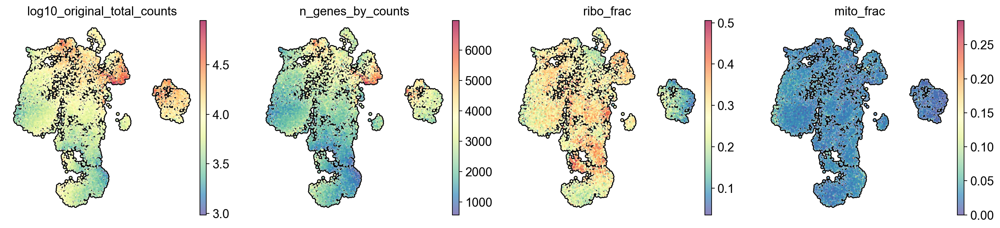

In [22]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    T_NK, 
    color=['log10_original_total_counts', 'n_genes_by_counts','ribo_frac', 'mito_frac'], 
    palette=user_defined_palette,  
    color_map='Spectral_r',
    use_raw=False,
    ncols=5,
    wspace = 0.2,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [1]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    T_NK, 
    color=['leiden_0.9', 'sample'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [63]:
T_NK_marker_genes = ['Ptprc', 'Cd3e', 'Trbc1', 'Cxcr6', 'Nkg7', 'Cd4', 'Cd8a', 'Foxp3', 'Cd1d1', 'Ncr1', 'Fcgr3', 'Ncam1', 'Sell', 'Il2ra', 'Cd44', 'Itga2', 'Tcf7', 'Tbx21', 'H2-K1', 'H2-D1']


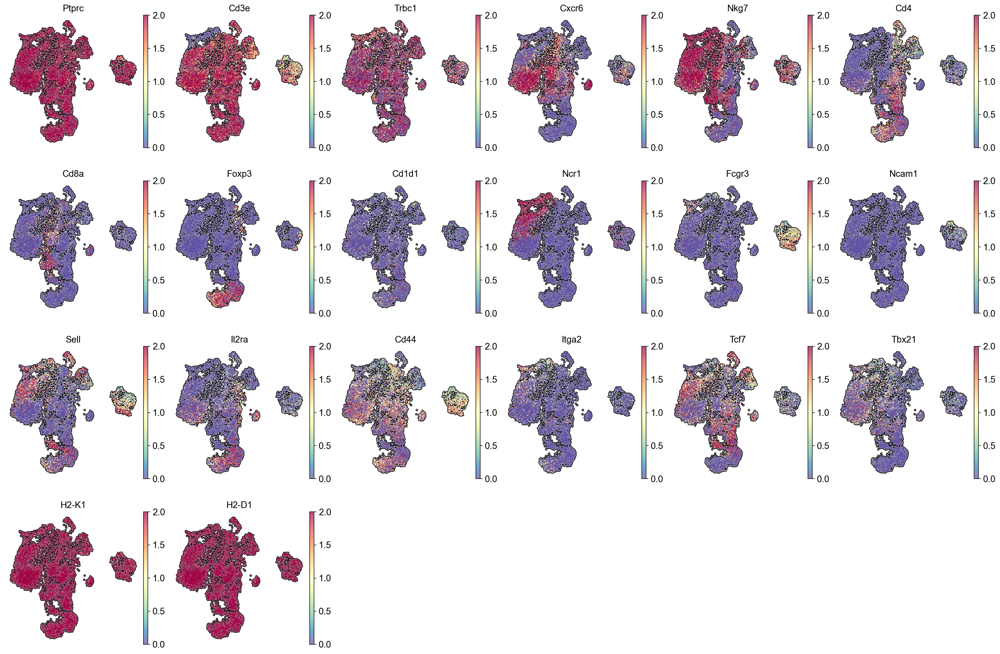

In [64]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    T_NK, 
    color=T_NK_marker_genes, 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=6,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=10,
    frameon=False,
    add_outline=True,
    sort_order = False,
    vmax=2
)

In [59]:
# to get gene list for defining unclear clusters (first need to run sc.tl wilcox)
sc.tl.rank_genes_groups(T_NK, 'leiden_0.9', method='wilcoxon', use_raw=False)
result = T_NK.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names']}).head(100)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:24)


,0_n,1_n,2_n,3_n,4_n,5_n,6_n,7_n,8_n,9_n,10_n,11_n,12_n,13_n,14_n,15_n
0,Lyst,Ccl5,Itgb1,Cyth1,S100a8,Ikzf2,Ikzf2,Ccl5,Ptma,Ncr1,Epsti1,Hmgb2,Eomes,Klf2,Tmem176a,Stmn1
1,Cxcr6,Klrd1,Slamf6,Npc2,S100a9,Foxp3,Ltb,Nkg7,Nme1,Tyrobp,Cyth1,Birc5,Myb,Lef1,Tmem176b,Top2a
2,Id2,Xcl1,Klf2,Fth1,Wfdc21,Ifi27l2a,Tnfrsf4,Cd8b1,Ranbp1,Fcer1g,Dnajc15,Mki67,Casp3,Sell,Ramp1,Tubb5
3,Satb1,Klrk1,Itga4,Gas5,Lyz2,S100a4,Zfp36l1,Ms4a4b,Ybx1,Klrd1,Cd8b1,Stmn1,Gapdh,Ccr7,Lgals3,Tuba1b
4,Gimap3,Tyrobp,Il7r,Tmsb4x,Hp,Tnfrsf4,Shisa5,Hcst,Hsp90ab1,Klrb1f,Cd52,Ccnb2,Hsp90ab1,Tpt1,Cxcr6,Igfbp4
5,Cd226,Cd7,Cd4,Eef1a1,Alox5ap,Srgn,Malat1,Itga4,Ran,Cd7,Ctla2a,Cks1b,Ybx3,S1pr1,Maf,Nusap1
6,Hopx,Nkg7,Emp3,Cd3g,Prdx5,Capg,Foxp3,Cd8a,Ppia,Gzma,Cxcr6,H2afv,C1qbp,Igfbp4,Il18r1,Mki67
7,Il2rb,Fcer1g,Malat1,Rgs10,Ly6g,S100a10,Pim1,Ms4a6b,Mif,Klrk1,S100a6,Cenpa,Ap3s1,Atp1b3,Lmo4,Ptma
8,Ly6c2,Cd160,Fau,Ifi27l2a,Pglyrp1,Tnfrsf18,Il7r,Trac,Dut,Klre1,Plac8,Cdca8,Mtch1,Npc2,Il7r,Birc5
9,Txk,Il2rb,Tnfsf8,Fxyd5,Anxa1,Samhd1,Tnfrsf18,Gm42418,Mcm3,Nkg7,Ms4a4c,Hmgn2,1700019D03Rik,Bcl2,Rora,Ube2s


In [ ]:
T_NK_to_h5ad = '/Users/brandonng/Google Drive/Weill Cornell/LAB/folder containing all data from Mac pro/experiments and data/single cell/2022-12-21 APRIL BB IL-18 single cell experiment/T_NK.h5ad'


In [ ]:
# T_NK.write(T_NK_to_h5ad)

In [16]:
# code to read back your saved h5ad object
T_NK = sc.read_h5ad(T_NK_to_h5ad)
T_NK.uns['log1p']["base"] = None

In [32]:
T_cells = T_NK[(T_NK.obs['leiden_0.9']=='1') | (T_NK.obs['leiden_0.9']=='2') | (T_NK.obs['leiden_0.9']=='3') | 
              (T_NK.obs['leiden_0.9']=='4') | (T_NK.obs['leiden_0.9']=='5') | (T_NK.obs['leiden_0.9']=='6') | 
              (T_NK.obs['leiden_0.9']=='7') | (T_NK.obs['leiden_0.9']=='8') | (T_NK.obs['leiden_0.9']=='10') | 
              (T_NK.obs['leiden_0.9']=='11') | (T_NK.obs['leiden_0.9']=='12') | (T_NK.obs['leiden_0.9']=='13') | 
              (T_NK.obs['leiden_0.9']=='14') | (T_NK.obs['leiden_0.9']=='15')]

In [130]:
T_cells_APRIL_BB = T_cells[T_cells.obs['sample']=='APRIL-BB']
T_cells_APRIL_BB_IL18 =T_cells[T_cells.obs['sample']=='APRIL-BB-IL18']

In [133]:
rng = np.random.RandomState(42) # use seed
sc.tl.pca(T_cells_APRIL_BB, n_comps=50, svd_solver='arpack', random_state=rng, use_highly_variable=False)
sc.pp.neighbors(T_cells_APRIL_BB, n_neighbors=15)
sc.tl.umap(T_cells_APRIL_BB)

computing PCA
    with n_comps=50
    finished (0:00:11)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:06)


In [134]:
rng = np.random.RandomState(42) # use seed
sc.tl.pca(T_cells_APRIL_BB_IL18, n_comps=50, svd_solver='arpack', random_state=rng, use_highly_variable=False)
sc.pp.neighbors(T_cells_APRIL_BB_IL18, n_neighbors=15)
sc.tl.umap(T_cells_APRIL_BB_IL18)

computing PCA
    with n_comps=50
    finished (0:00:10)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:05)


In [55]:
sc.pp.highly_variable_genes(T_cells, n_top_genes=1000, n_bins=20, flavor='seurat',  inplace=True)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:208: RuntimeWarning: invalid value encountered in log
  dispersion = np.log(dispersion)


In [56]:
# rerun PCA for new cell type
rng = np.random.RandomState(42)
T_cells = sc.tl.pca(T_cells, n_comps=200, copy = True, svd_solver='arpack', random_state=rng)

computing PCA
    on highly variable genes
    with n_comps=200
    finished (0:00:03)


<function matplotlib.pyplot.show(close=None, block=None)>

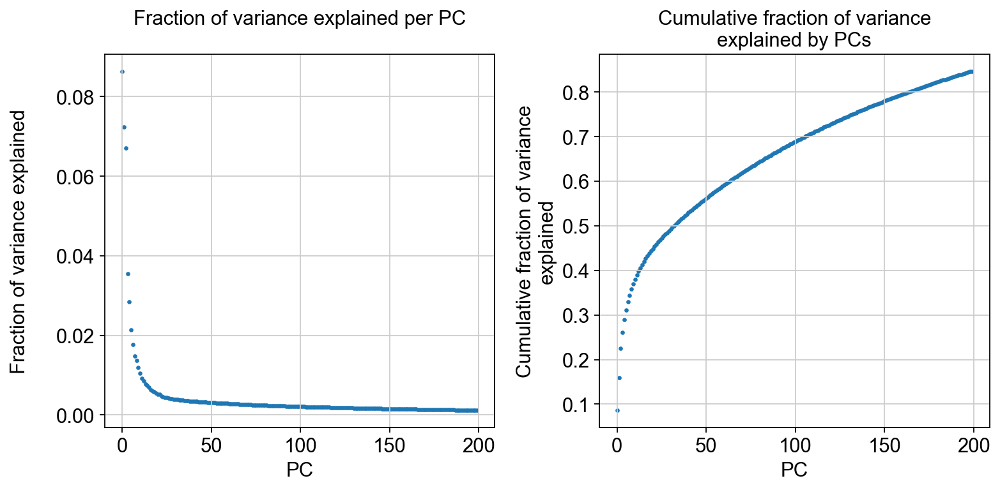

In [57]:
observe_variance(T_cells)

In [62]:
rng = np.random.RandomState(42) # use seed
sc.tl.pca(T_cells, n_comps=50, svd_solver='arpack', random_state=rng, use_highly_variable=False)
sc.pp.neighbors(T_cells, n_neighbors=15)
sc.tl.umap(T_cells)

computing PCA
    with n_comps=50
    finished (0:00:34)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)


In [22]:
for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    sc.tl.leiden(T_cells, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

running Leiden clustering
    finished: found 5 clusters and added
    'leiden_0.1', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 8 clusters and added
    'leiden_0.2', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 9 clusters and added
    'leiden_0.3', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 10 clusters and added
    'leiden_0.4', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 10 clusters and added
    'leiden_0.5', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 12 clusters and added
    'leiden_0.6', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 14 clusters and added
    'leiden_0.7', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clusteri

/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


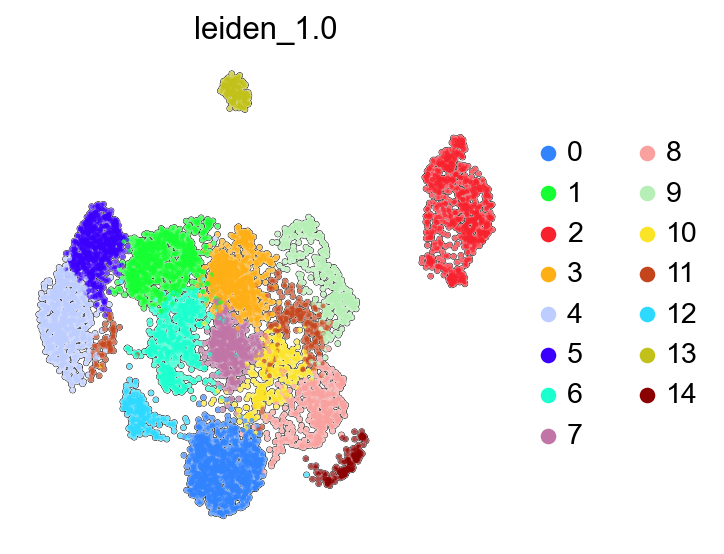

In [24]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)
sc.pl.umap(
    T_cells, 
    color='leiden_1.0', 
    palette=user_defined_palette,  
    color_map='Spectral_r',
    use_raw=False,
    ncols=5,
    wspace = 0.2,
    outline_width=[0.1, 0.05],
    size=20,
    frameon=False,
    add_outline=True,
    sort_order = False,
#     save="_T_cells_leiden0_6.pdf"
)

/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


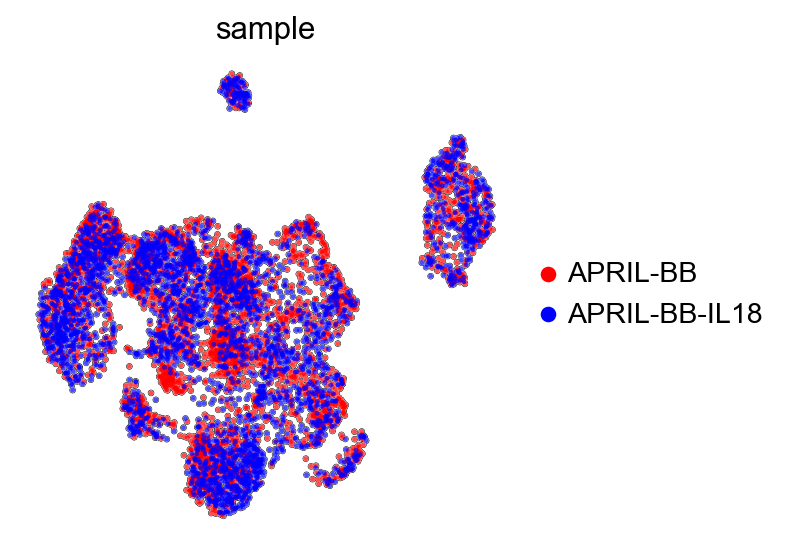

In [185]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)
sc.pl.umap(
    T_cells, 
    color='sample', 
    palette=['red', 'blue'],  
    color_map='Spectral_r',
    use_raw=False,
    ncols=5,
    wspace = 0.2,
    outline_width=[0.1, 0.05],
    size=20,
    frameon=False,
    add_outline=True,
    sort_order = False,
#     save="_T_cells_by_sample.pdf"
)

In [52]:
# to get gene list for defining unclear clusters (first need to run sc.tl wilcox)
sc.tl.rank_genes_groups(T_cells, 'leiden_0.6', method='wilcoxon', use_raw=False)
result = T_cells.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names']}).head(100)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:16)


,0_n,1_n,2_n,3_n,4_n,5_n,6_n,7_n,8_n,9_n,10_n,11_n
0,Ikzf2,Klrd1,Itgb1,Cyth1,S100a8,Stmn1,Hsp90ab1,Ccl5,Epsti1,Lef1,Tmem176b,Stmn1
1,Foxp3,Ccl5,Slamf6,Fth1,S100a9,Hmgb2,Gapdh,Nkg7,Cxcr6,Klf2,Tmem176a,Top2a
2,Tnfrsf4,Klrk1,Klf2,Sh3bgrl3,Wfdc21,Ptma,Npm1,Ms4a4b,Dnajc15,Ccr7,Ramp1,Tubb5
3,Tnfrsf18,Xcl1,Malat1,Id2,Lyz2,Ppia,C1qbp,Hcst,Cyth1,Tpt1,Cxcr6,Tuba1b
4,Pim1,Il2rb,Itga4,Tmsb4x,Hp,Pclaf,Ybx3,Cd8b1,Ctla2a,Bcl2,Lgals3,Nusap1
5,Ltb,Nkg7,Fau,Satb1,Alox5ap,Tuba1b,Ybx1,Cd8a,Cd52,Igfbp4,Il18r1,Igfbp4
6,Ifi27l2a,Txk,Gm42418,Npc2,Anxa1,Mki67,Hspe1,Gimap7,Cd8b1,Sell,Maf,Ptma
7,Capg,Tyrobp,Cd4,Inpp4b,Prdx5,Cks1b,Eif5a,Gm42418,Id2,S1pr1,Lmo4,Ube2s
8,Shisa5,Fcer1g,Btg1,Gas5,Ly6g,Rbm3,Casp3,Ms4a6b,Plac8,Satb1,Rora,Mki67
9,H2-D1,Cd7,Tnfsf8,Gabarapl2,Pglyrp1,Lmnb1,Ncl,Id2,Satb1,Atp1b3,Ckb,Birc5


In [18]:
#to add group and HTO distinctions
T_cells.obs['distinct'] = ''
T_cells.obs['distinct'] = T_cells.obs[['sample', 'hash_id']].agg(' '.join, axis=1)

In [14]:
T_cells_to_h5ad = '/Users/brandonng/Google Drive/Weill Cornell/LAB/folder containing all data from Mac pro/experiments and data/single cell/2022-12-21 APRIL BB IL-18 single cell experiment/T_cells.h5ad'


In [15]:
# T_cells.write(T_cells_to_h5ad)

In [16]:
# code to read back your saved h5ad object
T_cells = sc.read_h5ad(T_cells_to_h5ad)
T_cells.uns['log1p']["base"] = None

In [357]:
sc.tl.rank_genes_groups(T_cells, 'sample', method='wilcoxon', use_raw=False)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:17)


In [90]:
result = T_cells.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names']}).head(5)

,APRIL-BB_n,APRIL-BB-IL18_n
0,S100a9,Ifi27l2a
1,S100a8,Stat1
2,mt-Co3,B2m
3,mt-Co2,Ly6a
4,Camp,Zbp1


Scanpy's `sc.pl.heatmap` function creates a heatmap for all the genes of interest. Check scanpy's heatmap man page (https://scanpy.readthedocs.io/en/latest/generated/scanpy.pl.heatmap.html#scanpy-pl-heatmap) for a list of parameters and types of input.

In [92]:
T_cell_genes_combined_phenotypes_short = ['B2m','H2-D1', 'H2-K1', 'H2-T23', 'Psme1', 'Psme2', 'Psma7', 'Psmb8', 'Ifi27l2a', 'Ifi47', 
                                    'Ifngr1', 'Igtp', 'Irf1', 'Irf7', 
                                   'Isg15', 'Isg20', 'Stat1', 'Ly6a', 'Cd40lg',
                                    'Cd44', 'Cd5', 'Icos', 'Il2rg',
                                         'Cd27', 'Icosl', 'Tnfsf10', 'Cd274', 'Pdcd1', 'Havcr2', 'Lag3',
                                          'Snx2', 'Sem1', 'Cops9'
                                         ]

T_cell_genes_combined_phenotypes_short2 = ['B2m','H2-D1', 'H2-K1', 'H2-T23', 'Psme1', 'Psma7', 'Psmb8', 'Ifi27l2a', 'Ifi47', 
                                    'Ifngr1', 'Igtp', 'Irf1', 'Irf7', 
                                   'Isg15', 'Stat1', 'Ly6a', 'Cd40lg',
                                    'Cd44', 'Cd5', 'Icos', 'Il2rg',
                                         'Cd27', 'Snx2', 'Sem1', 'Cops9'
                                         ]

T_cell_genes_combined_phenotypes = ['B2m', 'H2-T23', 'Psme1', 'Psme2', 'Psma7', 'Psmb5', 'Psmb8', 'Psmb10', 'H2-D1',
                                     'H2-K1', 'H2-M3', 'H2-Q4', 'H2-Q6', 'H2-T22', 'H2-T23', 'Ifi27l2a', 'Ifi47', 
                                    'Ifngr1', 'Igtp', 'Irf1', 'Irf7', 'Irf9', 'Irgm1', 'Irgm2', 
                                   'Isg15', 'Isg20', 'Rtp4', 'Socs1', 'Stat1', 'Xaf1', 'Ly6a', 'Tnfrsf4', 'Cd40lg',
                                    'Cd44', 'Cd5', 'Cd6', 'Cish', 'Icos', 'Il2rg', 'Ly6e', 'Snx2', 'Sem1', 'Cops9', 'Ccnd2']

/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


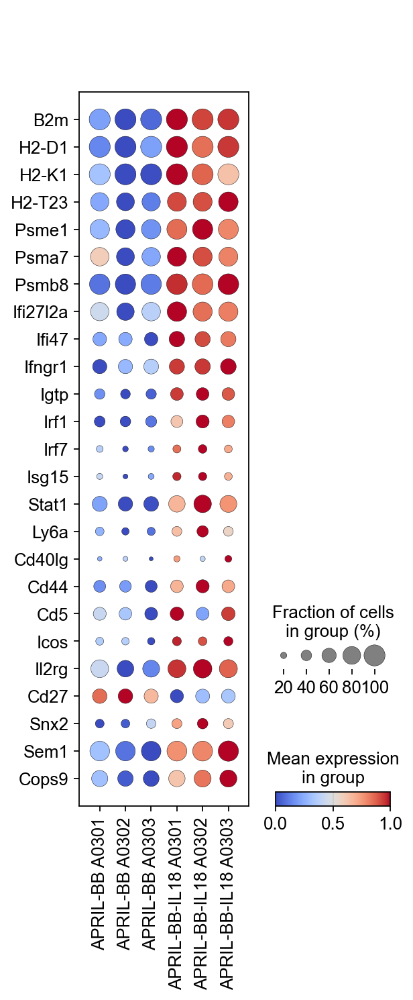

In [95]:
sc.pl.dotplot(T_cells,
              T_cell_genes_combined_phenotypes_short2,
              groupby='distinct',
              cmap='coolwarm',
              dendrogram=False,
              swap_axes=True,
              use_raw=False, 
              standard_scale='var',
#               save="T_cells_combined_phenotypes_short.pdf"
             )

 


In [228]:
T_cells.uns['leiden_0.6_colors']

['#3283fe',
 '#16ff32',
 '#f6222e',
 '#feaf16',
 '#bdcdff',
 '#3b00fb',
 '#1cffce',
 '#c075a6',
 '#f8a19f',
 '#b5efb5',
 '#fbe426',
 '#c4451c']

#### Stacked barplots

We can take advantage of pandas crosstab function to format our data for a barplot. We need to grouping factors (the order matters!) to create this type of frequencies table, prior to making a barplot using python's matplotlib package.

In [223]:
T_cells.obs['cell_type'] = ['CD45.1 CAR T cells' if x=='3' or x=='7' or x=='9'  else 
                            'CD45.2 host T cells' if x=='0' or x=='1' or x=='2' or x=='4' or x=='5' or x=='6' or x=='8' 
                            or x=='10' or x=='11' or x=='12' or x=='13' or x=='14' else
                            'gamma_delta' if x=='1' else
                           'ERROR' for x in T_cells.obs['leiden_1.0']]

/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


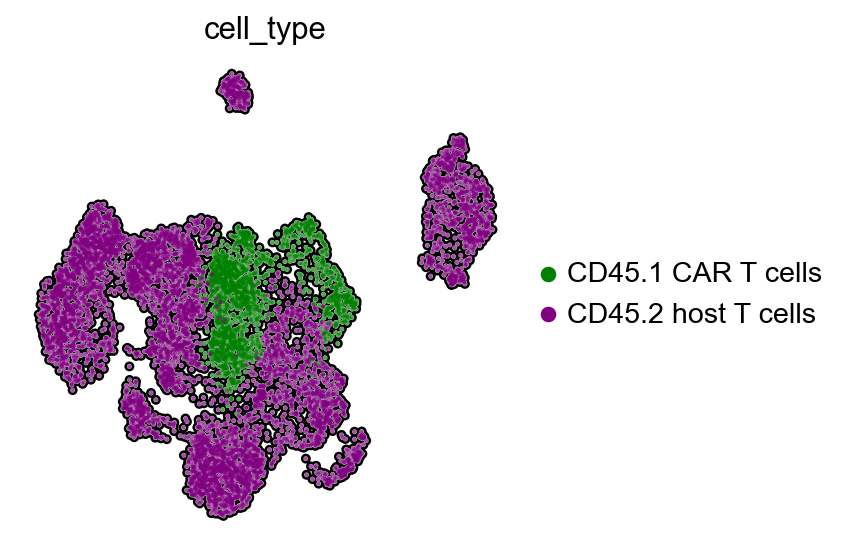

In [224]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)
sc.pl.umap(
    T_cells, 
    color=['cell_type'], 
    palette=['green', 'purple'],  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False,
#     save="_T_cells_groupby_45_1_2.pdf"
)

In [225]:
crosstb = pd.crosstab(T_cells.obs['sample'], T_cells.obs['cell_type'], normalize='index')

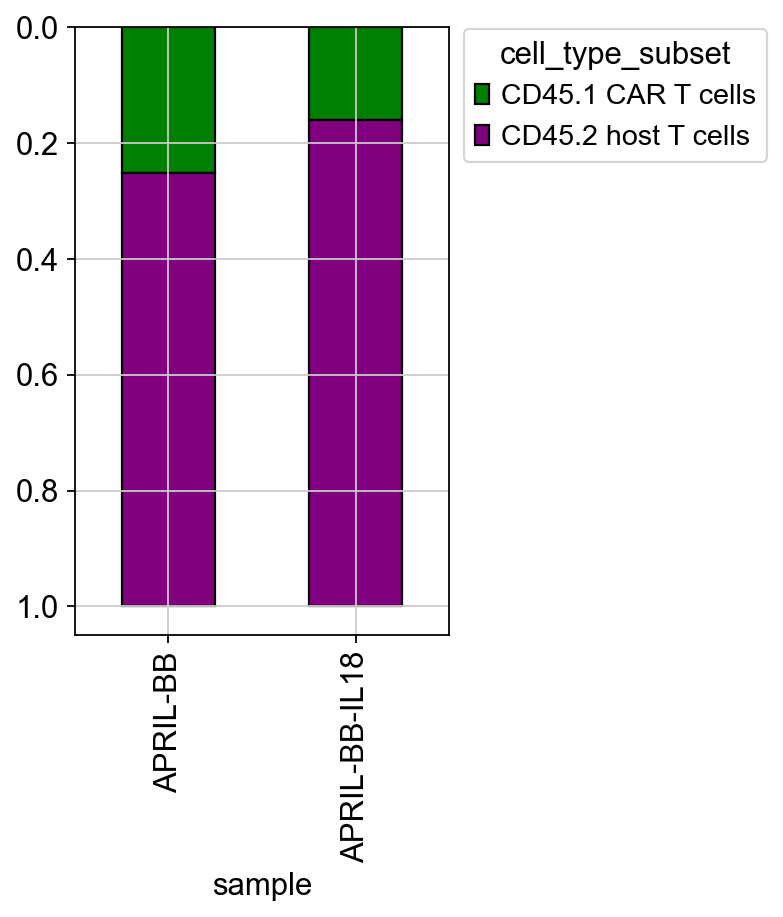

In [227]:
plt.rcParams['figure.figsize'] = [3, 5]

ax = crosstb.plot(kind='bar', stacked=True,  edgecolor = "black", color=T_cells.uns['cell_type_colors'])
ax.invert_yaxis()
ax.legend(title='cell_type_subset', bbox_to_anchor=(1, 1.02), loc='upper left')

In [28]:
# writer = pd.ExcelWriter('../2022-12-21 APRIL BB IL-18 single cell experiment/wilcox_distinct/T_cells_wilcox2.xlsx', engine='xlsxwriter')

sc.tl.rank_genes_groups(T_cells, 'sample', method='wilcoxon', use_raw=False, key_added = "wilcoxon")
result = T_cells.uns['rank_genes_groups']
groups = result['names'].dtype.names
# pd.DataFrame(
#     {group + '_' + key[:1]: result[key][group]
#     for group in groups for key in ['names', 'scores', 'logfoldchanges', 'pvals_adj']}).to_excel(writer, sheet_name='T_cells')
        
# writer.save()

ranking genes
    finished: added to `.uns['wilcoxon']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:15)


In [238]:
# plotting GSEA results together from rank list using gseapy

In [27]:
df = pd.read_csv('/Users/brandonng/Google Drive/Weill Cornell/LAB/folder containing all data from Mac pro/experiments and data/single cell/2022-12-21 APRIL BB IL-18 single cell experiment/wilcox_distinct/T_cells_wilcox2_rnk.txt',
                 sep='\t', header=0)


In [28]:
df

,#primer_id,#rank_score
0,S100a9,-35.551689
1,S100a8,-26.324907
2,Camp,-21.975504
3,Ngp,-20.289465
4,Lcn2,-19.800365
...,...,...
22951,Ube3a,-1.856639
22952,Birc5,-1.858319
22953,Gabarapl2,-1.862677
22954,1700019D03Rik,-1.862925


In [29]:
T_cells_pre_res_GO_BP = gseapy.prerank(df, min_size=10, seed = 42,
                                gene_sets='/Users/brandonng/Google Drive/Weill Cornell/LAB/folder containing all data from Mac pro/experiments and data/single cell/2022-12-21 APRIL BB IL-18 single cell experiment/gsea results/GO_BP/m5.go.bp.v2023.1.Mm.symbols.gmt')


2023-08-29 23:55:21,060 [WARNING] Duplicated values found in preranked stats: 38.00% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


In [30]:
T_cells_pre_res_GO_BP

In [ ]:
T_cells_pre_res_GO_BP_path = "/Users/brandonng/Google Drive/Weill Cornell/LAB/folder containing all data from Mac pro/experiments and data/single cell/2022-12-21 APRIL BB IL-18 single cell experiment/gsea results/T_cells_gseapy_GO_BP_unsorted.csv"
T_cells_pre_res_GO_BP.to_csv(T_cells_pre_res_GO_BP_path)


In [31]:
T_cells_pre_res_GO_BP_1 = T_cells_pre_res_GO_BP

In [32]:
T_cells_pre_res_GO_BP_1.res2d.head(100)

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,GOBP_PEPTIDE_CROSS_LINKING,-0.852749,-1.988759,0.0,0.040481,0.03,8/38,1.69%,Anxa1;Cstdc5;Cstdc4;Prss34;Stfa3;Stfa2l1;Stfa2...
1,prerank,GOBP_CELL_AGGREGATION,-0.93178,-1.982807,0.011494,0.026194,0.038,1/18,0.03%,Ltf
2,prerank,GOBP_INNATE_IMMUNE_RESPONSE_IN_MUCOSA,-0.951381,-1.917819,0.0,0.082947,0.162,2/15,0.03%,Camp;Ltf
3,prerank,GOBP_G_PROTEIN_COUPLED_RECEPTOR_SIGNALING_PATH...,-0.82452,-1.831891,0.015748,0.372962,0.6,2/25,4.74%,Anxa1;Vipr1
4,prerank,GOBP_TELENCEPHALON_REGIONALIZATION,-0.91424,-1.807609,0.0,0.456008,0.72,3/11,4.77%,Eomes;Tra2b;Adgrg1
5,prerank,GOBP_ANTIMICROBIAL_HUMORAL_RESPONSE,-0.705805,-1.79806,0.0,0.43795,0.76,12/90,2.94%,S100a9;Camp;Ltf;Wfdc21;Elane;Hmgn2;Ighg1;Ctsg;...
6,prerank,GOBP_RESPONSE_TO_YEAST,-0.949824,-1.787899,0.004808,0.438829,0.796,4/11,0.94%,Camp;Mpo;Elane;Ncf1
7,prerank,GOBP_ANTIMICROBIAL_HUMORAL_IMMUNE_RESPONSE_MED...,-0.734669,-1.770119,0.0,0.490834,0.864,7/65,2.40%,S100a9;Camp;Ltf;Elane;Hmgn2;Ccl1;Cxcl2
8,prerank,GOBP_LEUKOCYTE_MIGRATION_INVOLVED_IN_INFLAMMAT...,-0.84426,-1.747704,0.0,0.590019,0.922,6/25,1.68%,S100a9;S100a8;Elane;Cd24a;Itgam;Itgb2l
9,prerank,GOBP_ASTROCYTE_DEVELOPMENT,-0.77162,-1.743178,0.007812,0.558521,0.934,2/35,0.01%,S100a9;S100a8


In [218]:
T_cells_pre_res_GO_BP_1_sorted = T_cells_pre_res_GO_BP_1.res2d.sort_values('FDR q-val', ascending = True).reset_index(drop = True)


In [75]:
# gseapy.gseaplot(rank_metric=res.ranking, term=terms[13], **res.results[terms[13]],
               
#                )

In [219]:
T_cells_pre_res_GO_BP_1_sorted.head(100)

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,GOBP_CELLULAR_RESPONSE_TO_INTERFERON_BETA,0.847627,1.625795,0.0,0.004868,0.014,27/57,7.14%,Stat1;Igtp;Ifi47;Gbp6;Irgm1;Iigp1;Gbp7;Irf1;Gb...
1,prerank,GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION_OF_EN...,0.882519,1.618425,0.0,0.005111,0.02,13/35,2.16%,B2m;H2-T23;H2-D1;Tapbp;Tap1;Tap2;H2-Q7;H2-T22;...
2,prerank,GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION,0.802003,1.628281,0.0,0.007302,0.014,38/111,7.97%,B2m;Psme1;H2-T23;Psmb9;Psmb8;Psme2;H2-D1;Tapbp...
3,prerank,GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION_OF_PE...,0.873884,1.636757,0.0,0.007789,0.008,16/43,2.16%,B2m;H2-T23;H2-D1;Tapbp;Tap1;Tap2;Pdia3;Calr;H2...
4,prerank,GOBP_DETECTION_OF_CHEMICAL_STIMULUS_INVOLVED_I...,0.948786,1.582501,0.001235,0.019611,0.121,1/14,0.04%,Rtp4
5,prerank,GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION_VIA_M...,0.877427,1.584121,0.0,0.020932,0.112,10/32,1.00%,B2m;H2-T23;H2-D1;Tap2;H2-Q7;H2-T22;H2-M3;H2-Q4...
6,prerank,GOBP_TYPE_II_INTERFERON_MEDIATED_SIGNALING_PAT...,0.885692,1.584828,0.0,0.024145,0.108,15/25,6.53%,Stat1;Igtp;Irgm1;Socs1;Irf1;Parp9;Nmi;Ifngr1;I...
7,prerank,GOBP_CELL_AGGREGATION,-0.93178,-1.982807,0.011494,0.026194,0.038,1/18,0.03%,Ltf
8,prerank,GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION_OF_PE...,0.816319,1.5738,0.0,0.026652,0.183,23/63,7.97%,B2m;H2-T23;H2-D1;Tapbp;Ctss;Tap1;Tap2;Pdia3;Ca...
9,prerank,GOBP_PEPTIDE_CROSS_LINKING,-0.852749,-1.988759,0.0,0.040481,0.03,8/38,1.69%,Anxa1;Cstdc5;Cstdc4;Prss34;Stfa3;Stfa2l1;Stfa2...


AttributeError: Line2D.set() got an unexpected keyword argument 'terms'

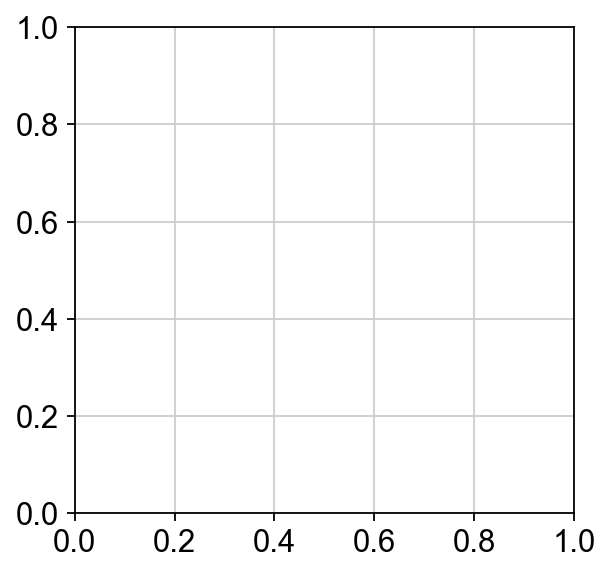

In [25]:
terms = T_cells_pre_res_GO_BP_1_sorted.Term
axs = T_cells_pre_res_GO_BP_1_sorted.plot(terms=terms[0]) # v1.0.5

In [221]:
T_cells_pre_res_GO_BP_1_sorted_path = "/Users/brandonng/Google Drive/Weill Cornell/LAB/folder containing all data from Mac pro/experiments and data/single cell/2022-12-21 APRIL BB IL-18 single cell experiment/gsea results/T_cells_gseapy_GO_BP.csv"
T_cells_pre_res_GO_BP_1_sorted.to_csv(T_cells_pre_res_GO_BP_1_sorted_path)


In [22]:
T_cells_pre_res_GO_BP_1_sorted = pd.read_csv('/Users/brandonng/Google Drive/Weill Cornell/LAB/folder containing all data from Mac pro/experiments and data/single cell/2022-12-21 APRIL BB IL-18 single cell experiment/gsea results/T_cells_gseapy_GO_BP.csv',
                  header=0)

In [24]:
T_cells_pre_res_GO_BP_1_sorted.head(100)

,Unnamed: 0,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,0,prerank,GOBP_CELLULAR_RESPONSE_TO_INTERFERON_BETA,0.847627,1.625795,0.000000,0.004868,0.014,27/57,7.14%,Stat1;Igtp;Ifi47;Gbp6;Irgm1;Iigp1;Gbp7;Irf1;Gb...
1,1,prerank,GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION_OF_EN...,0.882519,1.618425,0.000000,0.005111,0.020,13/35,2.16%,B2m;H2-T23;H2-D1;Tapbp;Tap1;Tap2;H2-Q7;H2-T22;...
2,2,prerank,GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION,0.802003,1.628281,0.000000,0.007302,0.014,38/111,7.97%,B2m;Psme1;H2-T23;Psmb9;Psmb8;Psme2;H2-D1;Tapbp...
3,3,prerank,GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION_OF_PE...,0.873884,1.636757,0.000000,0.007789,0.008,16/43,2.16%,B2m;H2-T23;H2-D1;Tapbp;Tap1;Tap2;Pdia3;Calr;H2...
4,4,prerank,GOBP_DETECTION_OF_CHEMICAL_STIMULUS_INVOLVED_I...,0.948786,1.582501,0.001235,0.019611,0.121,1/14,0.04%,Rtp4
5,5,prerank,GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION_VIA_M...,0.877427,1.584121,0.000000,0.020932,0.112,10/32,1.00%,B2m;H2-T23;H2-D1;Tap2;H2-Q7;H2-T22;H2-M3;H2-Q4...
6,6,prerank,GOBP_TYPE_II_INTERFERON_MEDIATED_SIGNALING_PAT...,0.885692,1.584828,0.000000,0.024145,0.108,15/25,6.53%,Stat1;Igtp;Irgm1;Socs1;Irf1;Parp9;Nmi;Ifngr1;I...
7,7,prerank,GOBP_CELL_AGGREGATION,-0.931780,-1.982807,0.011494,0.026194,0.038,1/18,0.03%,Ltf
8,8,prerank,GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION_OF_PE...,0.816319,1.573800,0.000000,0.026652,0.183,23/63,7.97%,B2m;H2-T23;H2-D1;Tapbp;Ctss;Tap1;Tap2;Pdia3;Ca...
9,9,prerank,GOBP_PEPTIDE_CROSS_LINKING,-0.852749,-1.988759,0.000000,0.040481,0.030,8/38,1.69%,Anxa1;Cstdc5;Cstdc4;Prss34;Stfa3;Stfa2l1;Stfa2...


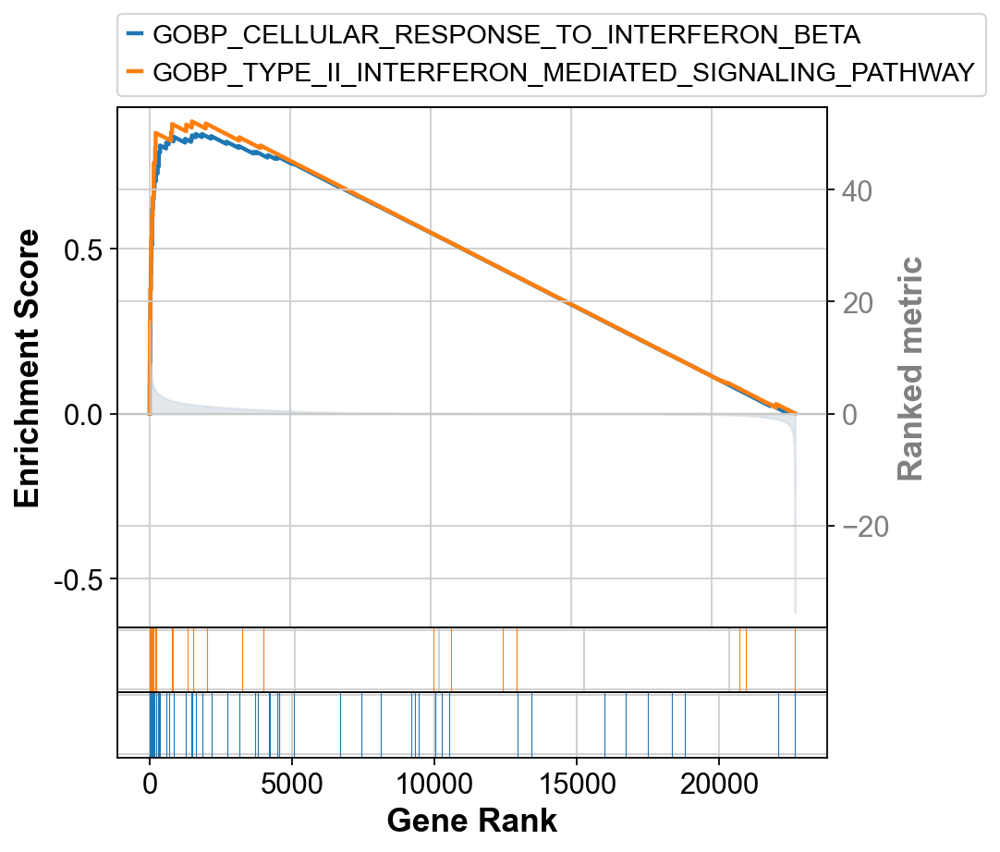

In [35]:
axs = T_cells_pre_res_GO_BP.plot(terms=[terms[0], terms[6]],
                   #legend_kws={'loc': (1.2, 0)}, # set the legend loc
                   show_ranking=True, # whether to show the second yaxis
                   figsize=(3,4))
# axs.savefig("T_cells_GSEApy_GO_BP_inteferon_signaling.pdf", bbox_inches = 'tight')

In [138]:
# add CITES

In [139]:
# add CITE annotation
cite_APRIL_BB = sc.read_h5ad("../2022-12-21 APRIL BB IL-18 single cell experiment/data/internal/10xGenomics/Chromium/BN-2099_group1_CITE/CiteSeq-results/BN-2099_group1.h5ad")
cite_APRIL_BB_IL18 = sc.read_h5ad("../2022-12-21 APRIL BB IL-18 single cell experiment/data/internal/10xGenomics/Chromium/BN-2099_group2_CITE/CiteSeq-results/BN-2099_group2.h5ad")

In [140]:
cite_APRIL_BB.obs.index = cite_APRIL_BB.obs['barcode_sequence']
cite_APRIL_BB_IL18.obs.index = cite_APRIL_BB_IL18.obs['barcode_sequence']

In [141]:
cite_APRIL_BB.obs.index.name = ''
cite_APRIL_BB_IL18.obs.index.name = ''

In [142]:
cite_APRIL_BB.var.index = cite_APRIL_BB.var['feature_name'].values
cite_APRIL_BB_IL18.var.index = cite_APRIL_BB_IL18.var['feature_name'].values

In [143]:
cites = sc.concat(
    [cite_APRIL_BB, cite_APRIL_BB_IL18], # the asterisk unpacks the list containing your AnnData objects. 
    join='outer', 
    label = 'status', 
    keys = ['APRIL-BB', 'APRIL-BB-IL18'], # or use your sample_names list (as used above) here. 
    # Make sure the order of the batch categories matches that of the AnnData objects 
    index_unique = '-1@'
)

In [144]:
cites_raw = sc.concat(
    [cite_APRIL_BB, cite_APRIL_BB_IL18], # the asterisk unpacks the list containing your AnnData objects. 
    join='outer', 
    label = 'status', 
    keys = ['APRIL-BB', 'APRIL-BB-IL18'], # or use your sample_names list (as used above) here. 
    # Make sure the order of the batch categories matches that of the AnnData objects 
    index_unique = '-1@'
)

In [145]:
cites_raw

AnnData object with n_obs × n_vars = 42307 × 129
    obs: 'unmapped', 'barcode_sequence', 'status'

In [146]:
cites.var['control']= cites.var_names.str.contains('isotype')

In [147]:
sc.pp.calculate_qc_metrics(
    cites, 
    percent_top=(5,10,15),
    var_type='antibodies',
    qc_vars=('control',),
    inplace=True)

In [148]:
cites

AnnData object with n_obs × n_vars = 42307 × 129
    obs: 'unmapped', 'barcode_sequence', 'status', 'n_antibodies_by_counts', 'log1p_n_antibodies_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_5_antibodies', 'pct_counts_in_top_10_antibodies', 'pct_counts_in_top_15_antibodies', 'total_counts_control', 'log1p_total_counts_control', 'pct_counts_control'
    var: 'control', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

In [149]:
cites.layers['counts']=cites.X.copy()

In [150]:
sc.pp.normalize_total(cites)

normalizing counts per cell
    finished (0:00:00)


In [151]:
rng = np.random.RandomState(42) # set seed 
sc.tl.pca(cites, n_comps=50,  svd_solver='arpack')
sc.pp.neighbors(cites, n_neighbors=15, random_state=42) # set seed
sc.tl.umap(cites)
sc.tl.leiden(cites, random_state=42, key_added='prot_leiden')

computing PCA
    with n_comps=50
    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:37)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:29)
running Leiden clustering
    finished: found 25 clusters and added
    'prot_leiden', the cluster labels (adata.obs, categorical) (0:00:14)


In [152]:
cites.obsp['protein_connectivities'] = cites.obsp['connectivities'].copy()

In [153]:
sc.tl.umap(cites)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:30)


In [154]:
cites.var['feature_name'] =cites.var_names

In [155]:
cites.var.index=cites.var['feature_name']

In [156]:
cites.obs["hash_id"]=T_cells.obs["hash_id"]

In [157]:
cites.var.index[:129]

Index(['anti-mouse CD4', 'anti-mouse CD8a', 'anti-mouse CD366 (Tim-3)',
       'anti-mouse CD279 (PD-1)', 'anti-mouse Ly-6C', 'anti-mouse/human CD11b',
       'anti-mouse Ly-6G', 'anti-human/mouse CD49f', 'anti-mouse/human CD44',
       'anti-mouse CD54',
       ...
       'anti-mouse CD159a (NKG2AB6)', 'anti-mouse Ly108', 'anti-mouse CD160',
       'anti-mouse CD85k (gp49 Receptor)', 'anti-mouse CD51',
       'anti-mouse CD94', 'anti-mouse CD205 (DEC-205)',
       'anti-mouse CD155 (PVR)', 'anti-mouse/rat CD81', 'anti-mouse CD45.1'],
      dtype='object', name='feature_name', length=129)

In [42]:
# cites_to_h5ad =  '/Users/brandonng/Google Drive/Weill Cornell/LAB/folder containing all data from Mac pro/experiments and data/single cell/2022-12-21 APRIL BB IL-18 single cell experiment/20230519_MM_IL-18_singlecell_cites.h5ad'

In [43]:
# cites.write(cites_to_h5ad)

In [44]:
# # code to read back your saved h5ad object
# cites = sc.read_h5ad(cites_to_h5ad)
# cites.uns['log1p']["base"] = None

In [45]:
# now we are mapping the CITE data to the T_NK object and not the original adata object

In [160]:
cites

AnnData object with n_obs × n_vars = 42307 × 129
    obs: 'unmapped', 'barcode_sequence', 'status', 'n_antibodies_by_counts', 'log1p_n_antibodies_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_5_antibodies', 'pct_counts_in_top_10_antibodies', 'pct_counts_in_top_15_antibodies', 'total_counts_control', 'log1p_total_counts_control', 'pct_counts_control', 'prot_leiden', 'hash_id'
    var: 'control', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'feature_name'
    uns: 'pca', 'neighbors', 'umap', 'leiden'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities', 'protein_connectivities'

In [163]:
# maybe not always needed?
del T_cells.obs['doublet_score']
del T_cells.obs['predicted_doublet']

In [164]:
import muon as mu
from muon import MuData
from muon import prot as pt

In [165]:
mu.set_options(display_style="html", display_html_expand=0b000);

In [166]:
mdata = MuData({"rna": T_cells, "prot": cites})

In [167]:
# we can use existing code to call cell types (based on leiden), then create new Muobject named that specific cell type

In [168]:
mdata.update_var()


In [169]:
mdata.update_obs()


In [170]:
mu.pp.intersect_obs(mdata)


In [171]:
mdata

rna:sample,category,"APRIL-BB,APRIL-BB,APRIL-BB,APRIL-BB,APRIL-BB,..."
rna:n_genes_by_counts,int32,"1948,1203,3251,1901,1196,1315,3287,3846,3225,5524,..."
rna:log1p_n_genes_by_counts,float64,"7.58,7.09,8.09,7.55,7.09,7.18,8.10,8.26,8.08,8.62,..."
rna:total_counts,float32,"5201.00,2728.00,8600.00,5551.00,2705.00,3173.00,..."
rna:log1p_total_counts,float32,"8.56,7.91,9.06,8.62,7.90,8.06,9.51,9.76,9.44,..."
rna:pct_counts_in_top_50_genes,float64,"31.15,33.21,22.00,31.94,33.90,35.42,30.81,31.09,..."
rna:pct_counts_in_top_100_genes,float64,"45.32,46.00,31.38,44.53,46.91,48.98,45.51,43.63,..."
rna:pct_counts_in_top_200_genes,float64,"55.82,57.81,42.00,56.71,58.26,59.38,56.16,54.57,..."
rna:pct_counts_in_top_500_genes,float64,"69.72,74.23,56.90,71.50,74.27,74.31,68.38,66.88,..."
rna:original_total_counts,float32,"5201.00,2728.00,8600.00,5551.00,2705.00,3173.00,..."
rna:log10_original_total_counts,float32,"3.72,3.44,3.93,3.74,3.43,3.50,4.13,4.24,4.10,4.57,..."


In [172]:
cites = mdata.mod['prot']

In [173]:
rng = np.random.RandomState(42) # set seed 
sc.tl.pca(cites, n_comps=50,  svd_solver='arpack')
sc.pp.neighbors(cites, n_neighbors=15, random_state=42) # set seed
sc.tl.umap(cites)


computing PCA
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:11)


In [444]:
for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    sc.tl.leiden(cites, resolution=resolution_parameter, random_state=42, 
                        key_added='prot_leiden_'+str(resolution_parameter))

sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    cites, 
    color=['prot_leiden_0.1', 'prot_leiden_0.2', 'prot_leiden_0.3', 'prot_leiden_0.4', 'prot_leiden_0.5', 
           'prot_leiden_0.6', 'prot_leiden_0.7', 'prot_leiden_0.8', 'prot_leiden_0.9', 'prot_leiden_1.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r',
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

running Leiden clustering
    finished: found 5 clusters and added
    'prot_leiden_0.1', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 8 clusters and added
    'prot_leiden_0.2', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 8 clusters and added
    'prot_leiden_0.3', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 9 clusters and added
    'prot_leiden_0.4', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 12 clusters and added
    'prot_leiden_0.5', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 13 clusters and added
    'prot_leiden_0.6', the cluster labels (adata.obs, categorical) (0:00:01)
running Leiden clustering
    finished: found 13 clusters and added
    'prot_leiden_0.7', the cluster labels (adata.obs, categorical)

/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8

In [174]:
mdata.update_var()


In [175]:
mdata.update_obs()


In [176]:
mu.pp.intersect_obs(mdata)


In [72]:
cites.obs

,unmapped,barcode_sequence,status,n_antibodies_by_counts,log1p_n_antibodies_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_5_antibodies,pct_counts_in_top_10_antibodies,pct_counts_in_top_15_antibodies,...,prot_leiden_0.1,prot_leiden_0.2,prot_leiden_0.3,prot_leiden_0.4,prot_leiden_0.5,prot_leiden_0.6,prot_leiden_0.7,prot_leiden_0.8,prot_leiden_0.9,prot_leiden_1.0
,,,,,,,,,,,,,,,,,,,,,
GCAACATCACCGGAAA-1@APRIL-BB,1112,GCAACATCACCGGAAA,APRIL-BB,128,4.859812,15106,9.622913,34.840461,50.026480,59.909970,...,2,4,4,5,5,5,4,3,4,1
TCAGCAATCGCTCCTA-1@APRIL-BB,450,TCAGCAATCGCTCCTA,APRIL-BB,120,4.795791,6776,8.821290,46.782763,61.629280,70.129870,...,0,2,2,1,0,0,0,0,0,5
TGTGATGAGCCAGACA-1@APRIL-BB,803,TGTGATGAGCCAGACA,APRIL-BB,117,4.770685,5630,8.636042,40.088810,56.181172,65.790409,...,1,1,1,0,1,4,3,1,2,6
TCGTGCTTCTTTGGAG-1@APRIL-BB,178,TCGTGCTTCTTTGGAG,APRIL-BB,106,4.672829,2372,7.771910,40.640809,55.016863,64.586847,...,0,2,2,1,0,0,0,0,0,5
ACACTGACATCCGATA-1@APRIL-BB,428,ACACTGACATCCGATA,APRIL-BB,113,4.736198,4256,8.356320,47.767857,61.912594,69.783835,...,0,0,0,4,4,3,6,4,5,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GGTTAACAGTCCGCCA-1@APRIL-BB-IL18,790,GGTTAACAGTCCGCCA,APRIL-BB-IL18,111,4.718499,5455,8.604471,49.844180,65.682860,74.958753,...,0,0,0,3,3,2,5,5,3,3
AGTGATCGTGGCTACC-1@APRIL-BB-IL18,1072,AGTGATCGTGGCTACC,APRIL-BB-IL18,111,4.718499,7493,8.921858,47.097291,65.434405,74.976645,...,0,2,2,1,0,0,0,0,0,2
CGGGCATTCTGTCGTC-1@APRIL-BB-IL18,686,CGGGCATTCTGTCGTC,APRIL-BB-IL18,108,4.691348,4179,8.338067,39.698492,54.630294,64.154104,...,0,2,2,1,0,0,0,0,0,5


In [177]:
T_NK_cite_markers = ['anti-mouse CD45.2', 'anti-mouse CD45.1', 'anti-mouse CD3', 'anti-mouse CD4', 'anti-mouse CD8a',
                     'anti-mouse CD1d (CD1.1, Ly-38)', 'anti-mouse TCR {GREEK SMALL LETTER BETA} chain',
                     'anti-mouse CD11a',
                     'anti-mouse/human CD11b', 'anti-mouse Ly-6C', 'anti-mouse CD49b', 'anti-mouse Ly49H',
                     'anti-mouse Ly49D', 'anti-mouse Ly-49A', 'anti-mouse CD159a (NKG2AB6)', 
                     'anti-mouse CD107a (LAMP-1)', 'anti-mouse CD94', 
                     'anti-mouse I-A/I-E', 'anti-mouse CD366 (Tim-3)', 'anti-mouse CD279 (PD-1)', 
                     'anti-mouse CD223 (LAG-3)', 'anti-mouse CX3CR1', 'anti-mouse CD274 (B7-H1, PD-L1)', 
                     'anti-mouse CD11a', 'anti-mouse CD200R (OX2R)', 'anti-mouse CD137', 'anti-mouse CD69', 
                     'anti-mouse/human CD44', 'anti-mouse CD25', 'anti-mouse CD62L', 'anti-mouse/rat/human CD27',
                     'anti-mouse CD357 (GITR)', 'anti-mouse CD127 (IL-7R{GREEK SMALL LETTER ALPHA})',
                    'anti-mouse/human KLRG1 (MAFA)', 'anti-mouse CD38', 'anti-mouse CD226 (DNAM-1)',
                    'anti-mouse IL-33R{GREEK SMALL LETTER ALPHA} (IL1RL1, ST2)']


In [178]:
control_cite_markers = ['Mouse IgG1, {GREEK SMALL LETTER KAPPA} isotype Ctrl', 'Mouse IgG2a, {GREEK SMALL LETTER KAPPA} isotype Ctrl',
                        'Mouse IgG2b, {GREEK SMALL LETTER KAPPA} isotype Ctrl', 'Rat IgG2b, {GREEK SMALL LETTER KAPPA} Isotype Ctrl',
                        'Rat IgG1, {GREEK SMALL LETTER KAPPA} isotype Ctrl', 'Rat IgG1, {GREEK SMALL LETTER LAMDA} Isotype Ctrl',
                        'Rat IgG2a, {GREEK SMALL LETTER KAPPA} Isotype Ctrl', 'Rat IgG2c, {GREEK SMALL LETTER KAPPA} Isotype Ctrl',
                        'Armenian Hamster IgG Isotype Ctrl', 'anti-mouse TER-119/Erythroid Cells']
                                     

In [450]:
mdata

rna:sample,category,"APRIL-BB,APRIL-BB,APRIL-BB,APRIL-BB,APRIL-BB,..."
rna:n_genes_by_counts,int32,"1948,1203,3251,1901,1196,1315,3287,3846,3225,5524,..."
rna:log1p_n_genes_by_counts,float64,"7.58,7.09,8.09,7.55,7.09,7.18,8.10,8.26,8.08,8.62,..."
rna:total_counts,float32,"5201.00,2728.00,8600.00,5551.00,2705.00,3173.00,..."
rna:log1p_total_counts,float32,"8.56,7.91,9.06,8.62,7.90,8.06,9.51,9.76,9.44,..."
rna:pct_counts_in_top_50_genes,float64,"31.15,33.21,22.00,31.94,33.90,35.42,30.81,31.09,..."
rna:pct_counts_in_top_100_genes,float64,"45.32,46.00,31.38,44.53,46.91,48.98,45.51,43.63,..."
rna:pct_counts_in_top_200_genes,float64,"55.82,57.81,42.00,56.71,58.26,59.38,56.16,54.57,..."
rna:pct_counts_in_top_500_genes,float64,"69.72,74.23,56.90,71.50,74.27,74.31,68.38,66.88,..."
rna:original_total_counts,float32,"5201.00,2728.00,8600.00,5551.00,2705.00,3173.00,..."
rna:log10_original_total_counts,float32,"3.72,3.44,3.93,3.74,3.43,3.50,4.13,4.24,4.10,4.57,..."


/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


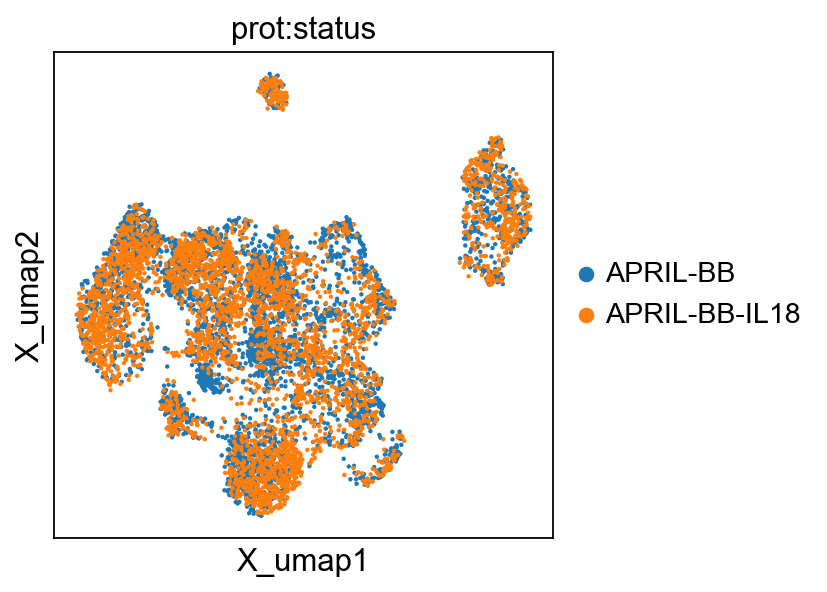

In [451]:
mu.pl.embedding(mdata, basis="rna:X_umap", color="prot:status", use_raw=False, vmax=100)


/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


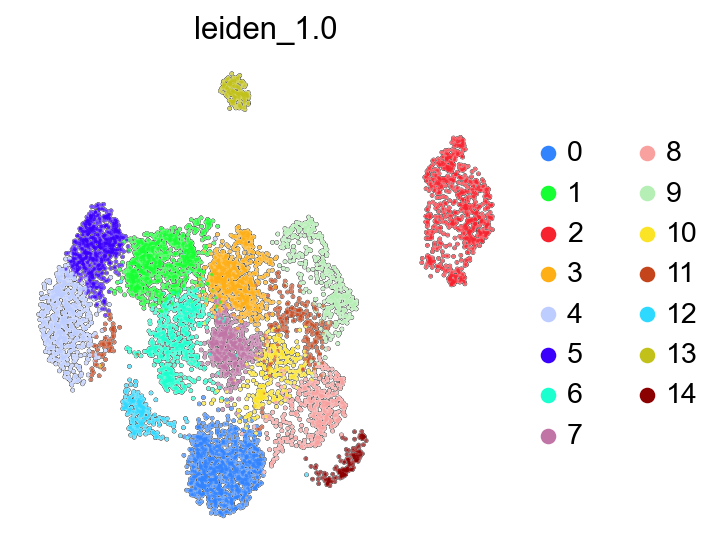

In [180]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)
sc.pl.umap(
    T_cells, 
    color='leiden_1.0', 
    palette=user_defined_palette,  
    color_map='Spectral_r',
    use_raw=False,
    ncols=5,
    wspace = 0.2,
    outline_width=[0.1, 0.05],
    size=10,
    frameon=False,
    add_outline=True,
    sort_order = False,
#     save="_T_cells_leiden1_0.pdf"
)

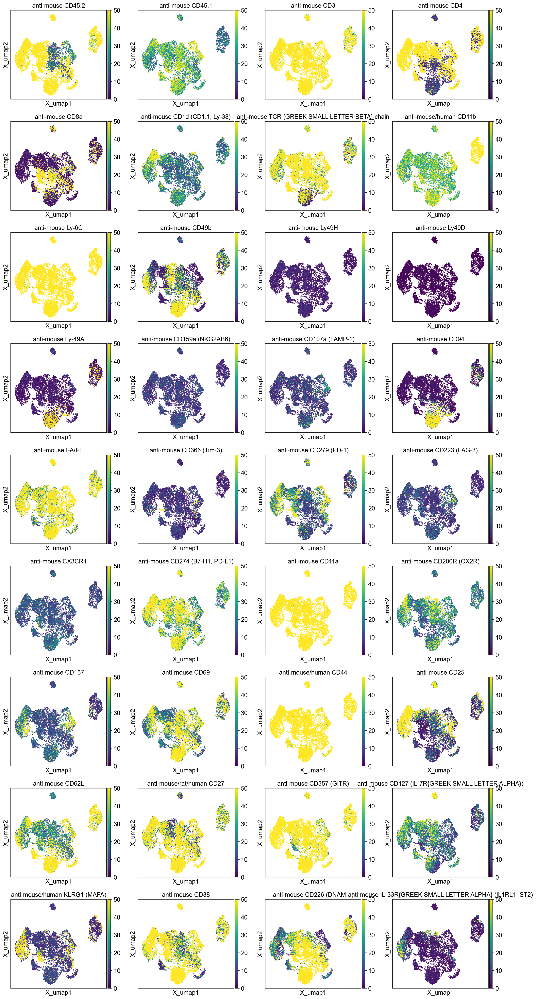

In [176]:
mu.pl.embedding(mdata, basis="rna:X_umap", color=T_NK_cite_markers, use_raw=False, vmin=0, vmax=50)


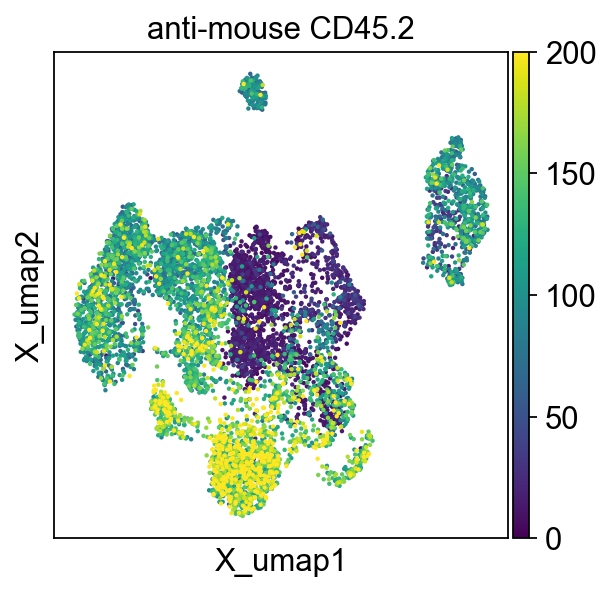

In [221]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)
mu.pl.embedding(mdata, basis="rna:X_umap", color='anti-mouse CD45.2', use_raw=False, vmax=200,
               save="_CD45_2_CITE.pdf"
               )


In [117]:
cites.obsm['X_umap_rna']=mdata.mod['rna'].obsm['X_umap']

In [68]:
cites.var

,control,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts,feature_name,highly_variable
feature_name,,,,,,,,,
anti-mouse CD4,False,41192,69.717375,4.258691,2.635498,2949533,14.897158,anti-mouse CD4,True
anti-mouse CD8a,False,33697,12.997518,2.638880,20.351242,549886,13.217468,anti-mouse CD8a,True
anti-mouse CD366 (Tim-3),False,40835,8.660458,2.268041,3.479330,366398,12.811478,anti-mouse CD366 (Tim-3),True
anti-mouse CD279 (PD-1),False,40962,11.214504,2.502624,3.179143,474452,13.069918,anti-mouse CD279 (PD-1),True
anti-mouse Ly-6C,False,42303,325.574964,5.788660,0.009455,13774100,16.438301,anti-mouse Ly-6C,True
anti-mouse/human CD11b,False,42300,717.885244,6.577702,0.016546,30371571,17.229018,anti-mouse/human CD11b,True
anti-mouse Ly-6G,False,42300,969.018862,6.877316,0.016546,40996281,17.528992,anti-mouse Ly-6G,True
anti-human/mouse CD49f,False,42287,63.175243,4.161618,0.047274,2672755,14.798621,anti-human/mouse CD49f,True
anti-mouse/human CD44,False,42305,650.980972,6.480015,0.004727,27541052,17.131188,anti-mouse/human CD44,True


In [ ]:
# making heatmap with CITEseq data

In [162]:
# make distinct labeling (Samples + HTO) for cite seq data
#to add group and HTO distinctions
cites.obs['distinct'] = ''
cites.obs['distinct'] = cites.obs[['status', 'hash_id']].agg(' '.join, axis=1)

TypeError: sequence item 1: expected str instance, float found

In [454]:
T_NK_cite_markers_short = ['anti-mouse Ly-6C',
                           'anti-mouse CX3CR1',
                           'anti-mouse CD274 (B7-H1, PD-L1)', 
                     'anti-mouse CD69', 
                     'anti-mouse/human CD44',
                           'anti-mouse CD62L',
                           'anti-mouse/rat/human CD27',
                     'anti-mouse CD127 (IL-7R{GREEK SMALL LETTER ALPHA})'
                    ]


/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


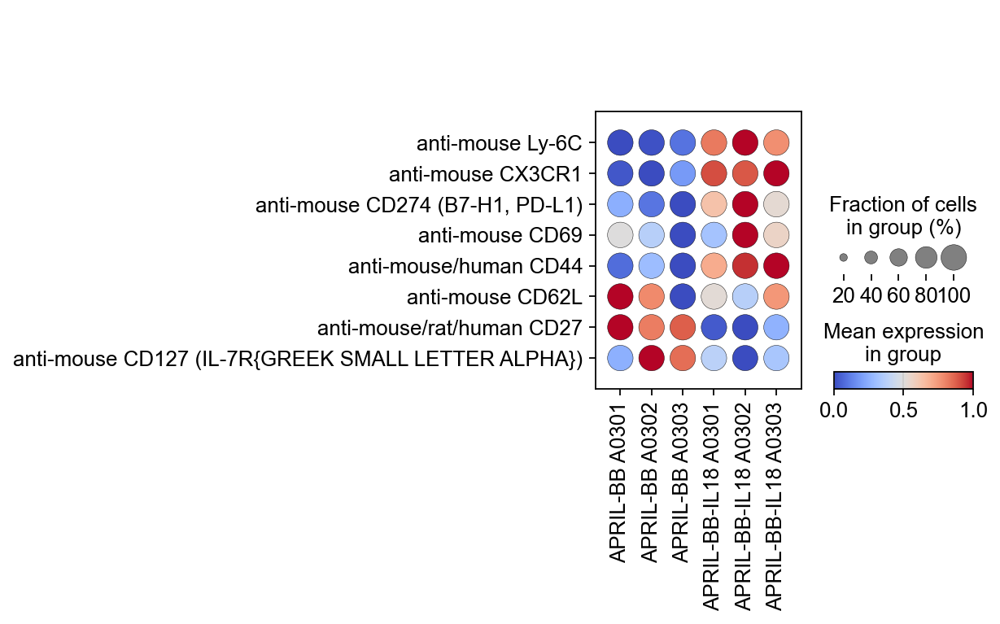

In [457]:
CITE_dotplot_T_cells = sc.pl.dotplot(cites,
                                     T_NK_cite_markers_short, groupby='distinct', cmap='coolwarm',
                                     standard_scale='var', use_raw=False, dendrogram=False, swap_axes=True,
#                                     save="_T_cells_CITE_markers.pdf"
                                    )


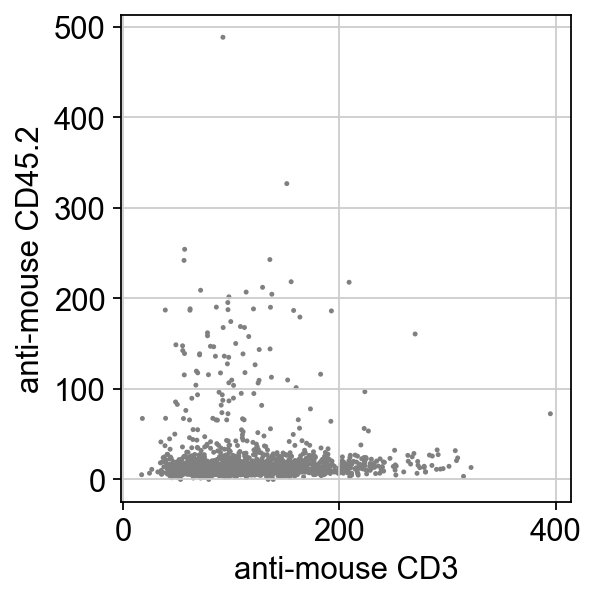

In [222]:
sc.pl.scatter(CD45_1_cites, 'anti-mouse CD3', 'anti-mouse CD45.2', use_raw=False, size=20)


In [242]:
CD45_2_contaminants = CD45_1_cites[CD45_1_cites[: , ['anti-mouse CD45.2']].X > 50, :]

In [243]:
CD45_2_contaminants

View of AnnData object with n_obs × n_vars = 105 × 129
    obs: 'unmapped', 'barcode_sequence', 'status', 'n_antibodies_by_counts', 'log1p_n_antibodies_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_5_antibodies', 'pct_counts_in_top_10_antibodies', 'pct_counts_in_top_15_antibodies', 'total_counts_control', 'log1p_total_counts_control', 'pct_counts_control', 'prot_leiden', 'hash_id', 'distinct'
    var: 'control', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'feature_name'
    uns: 'pca', 'neighbors', 'umap', 'leiden'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities', 'protein_connectivities'

In [241]:
CD45_1_cites

AnnData object with n_obs × n_vars = 1573 × 129
    obs: 'unmapped', 'barcode_sequence', 'status', 'n_antibodies_by_counts', 'log1p_n_antibodies_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_5_antibodies', 'pct_counts_in_top_10_antibodies', 'pct_counts_in_top_15_antibodies', 'total_counts_control', 'log1p_total_counts_control', 'pct_counts_control', 'prot_leiden', 'hash_id', 'distinct'
    var: 'control', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'feature_name'
    uns: 'pca', 'neighbors', 'umap', 'leiden'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities', 'protein_connectivities'

/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


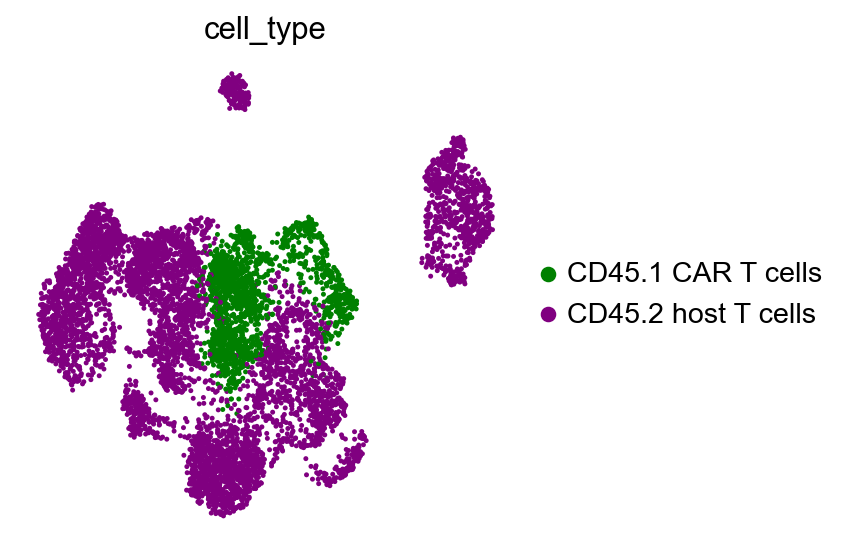

In [237]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)
sc.pl.umap(
    T_cells, 
    color=['cell_type'], 
    palette=['green', 'purple'],  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=20,
    frameon=False,
    add_outline=False,
    sort_order = False,
    save="_T_cells_groupby_45_1_2.pdf"
)

In [225]:
crosstb = pd.crosstab(T_cells.obs['sample'], T_cells.obs['cell_type'], normalize='index')

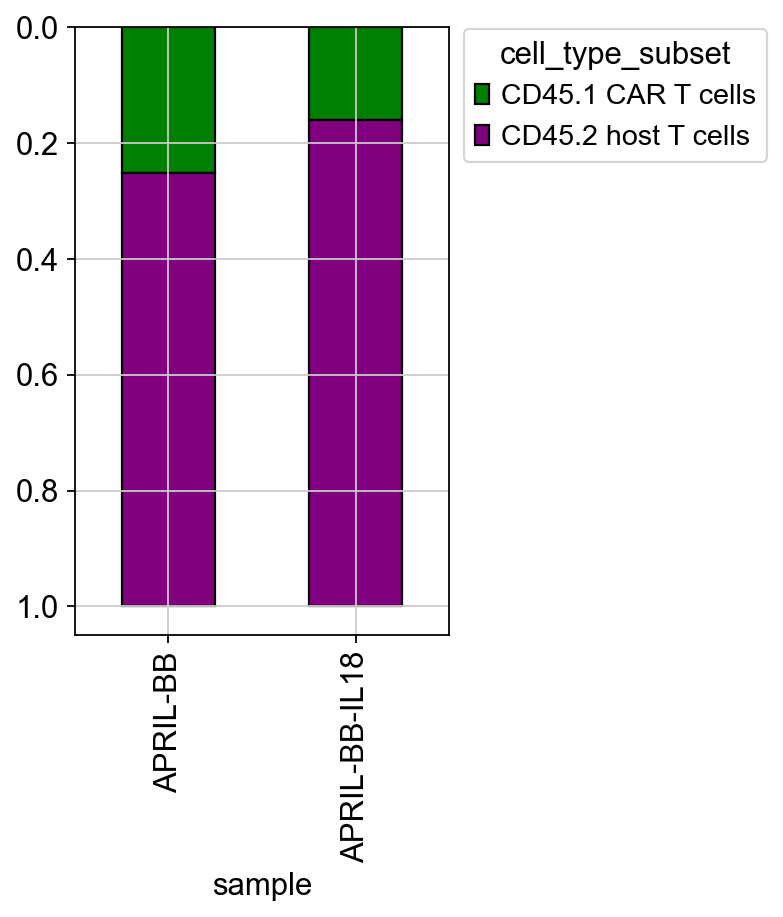

In [227]:
plt.rcParams['figure.figsize'] = [3, 5]

ax = crosstb.plot(kind='bar', stacked=True,  edgecolor = "black", color=T_cells.uns['cell_type_colors'])
ax.invert_yaxis()
ax.legend(title='cell_type_subset', bbox_to_anchor=(1, 1.02), loc='upper left')

In [ ]:
# CD45.1 T cells, which is based on CD45.2 expression with CITE seq

In [32]:
CD45_1_T_cells = T_cells[(T_cells.obs['leiden_1.0']=='3') | 
                         (T_cells.obs['leiden_1.0']=='7') | 
                         (T_cells.obs['leiden_1.0']=='9')]
                                                                                                
                                                                                                

In [33]:
sc.pp.highly_variable_genes(CD45_1_T_cells, n_top_genes=1000, n_bins=20, flavor='seurat',  inplace=True)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)


/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:208: RuntimeWarning: invalid value encountered in log
  dispersion = np.log(dispersion)
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [34]:
# rerun PCA for new cell type
rng = np.random.RandomState(42)
CD45_1_T_cells = sc.tl.pca(CD45_1_T_cells, n_comps=200, copy = True, svd_solver='arpack', random_state=rng)

computing PCA
    on highly variable genes
    with n_comps=200
    finished (0:00:01)


<function matplotlib.pyplot.show(close=None, block=None)>

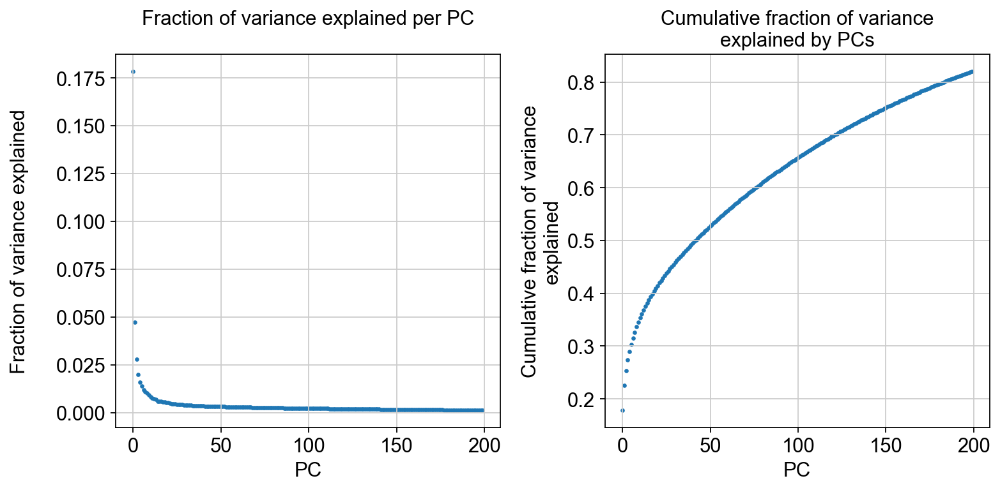

In [35]:
observe_variance(CD45_1_T_cells)

In [36]:
rng = np.random.RandomState(42) # use seed
sc.tl.pca(CD45_1_T_cells, n_comps=50, svd_solver='arpack', random_state=rng, use_highly_variable=True)
sc.pp.neighbors(CD45_1_T_cells, n_neighbors=15)
sc.tl.umap(CD45_1_T_cells)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:04)


In [37]:
for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    sc.tl.leiden(CD45_1_T_cells, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

running Leiden clustering
    finished: found 2 clusters and added
    'leiden_0.1', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 3 clusters and added
    'leiden_0.2', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 3 clusters and added
    'leiden_0.3', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 4 clusters and added
    'leiden_0.4', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 6 clusters and added
    'leiden_0.5', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 6 clusters and added
    'leiden_0.6', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 6 clusters and added
    'leiden_0.7', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
 

/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8

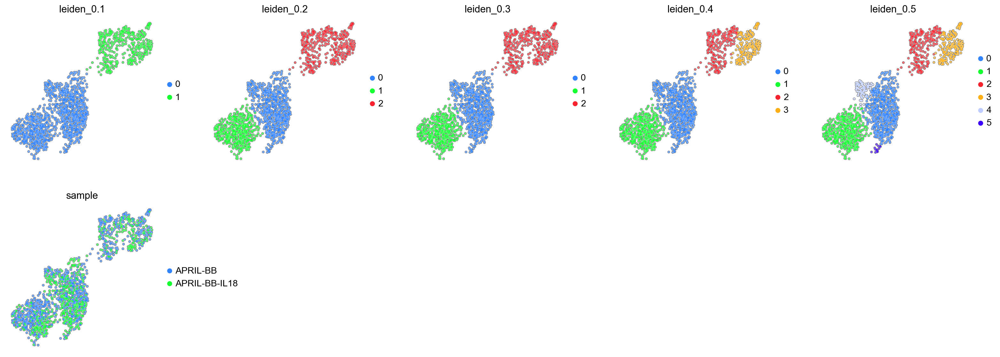

In [97]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)
sc.pl.umap(
    CD45_1_T_cells, 
    color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 'sample'], 
    palette=user_defined_palette,  
    color_map='Spectral_r',
    use_raw=False,
    ncols=5,
    wspace = 0.2,
    outline_width=[0.1, 0.05],
    size=30,
    frameon=False,
    add_outline=True,
    sort_order = False,
#     save="_T_cells_leiden0_6.pdf"
)

In [94]:
CD45_1_T_cells_to_h5ad = '/Users/brandonng/Google Drive/Weill Cornell/LAB/folder containing all data from Mac pro/experiments and data/single cell/2022-12-21 APRIL BB IL-18 single cell experiment/CD45_1_T_cells.h5ad'


In [95]:
# CD45_1_T_cells.write(CD45_1_T_cells_to_h5ad)

In [96]:
# code to read back your saved h5ad object
CD45_1_T_cells = sc.read_h5ad(CD45_1_T_cells_to_h5ad)
CD45_1_T_cells.uns['log1p']["base"] = None

In [44]:
CD45_1_T_cells

AnnData object with n_obs × n_vars = 1574 × 22956
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'original_total_counts', 'log10_original_total_counts', 'mito_frac', 'ribo_frac', 'hb_frac', 'hash_id', 'doublet_score', 'predicted_doublet', 'n_counts', 'leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0', 'keep_cell', 'distinct', 'cell_type'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mt', 'ribo', 'hb', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cell_type_colors', 'hash_id_colors', 'hvg', 'leiden', 'leiden_0.1_colors', 'leiden_0.2_colors', 'leiden_0.3_colors', 'leiden_0.4_colors', 'leiden_0.5_colors', 

In [ ]:
# plotting GSEA results together from rank list using gseapy

In [98]:
CD45_1_T_cells.uns

OverloadedDict, wrapping:
	{'hash_id_colors': array(['#3283fe', '#16ff32', '#f6222e'], dtype=object), 'hvg': {'flavor': 'seurat'}, 'leiden': {'params': {'n_iterations': -1, 'random_state': 42, 'resolution': 1.0}}, 'leiden_0.1_colors': array(['#3283fe', '#16ff32', '#f6222e'], dtype=object), 'leiden_0.2_colors': array(['#3283fe', '#16ff32', '#f6222e', '#feaf16'], dtype=object), 'leiden_0.3_colors': array(['#3283fe', '#16ff32', '#f6222e', '#feaf16'], dtype=object), 'leiden_0.4_colors': array(['#3283fe', '#16ff32', '#f6222e', '#feaf16', '#bdcdff'],
      dtype=object), 'leiden_0.5_colors': array(['#3283fe', '#16ff32', '#f6222e', '#feaf16', '#bdcdff'],
      dtype=object), 'leiden_0.6_colors': array(['#3283fe', '#16ff32', '#feaf16', '#3b00fb', '#1cffce', '#f8a19f'],
      dtype=object), 'leiden_0.7_colors': array(['#3283fe', '#f6222e', '#feaf16', '#3b00fb', '#1cffce', '#f8a19f',
       '#fbe426'], dtype=object), 'leiden_0.8_colors': array(['#3283fe', '#f6222e', '#feaf16', '#1cffce', '#c075a

In [45]:
writer = pd.ExcelWriter('../2022-12-21 APRIL BB IL-18 single cell experiment/wilcox_distinct/CD45_1_T_cells_wilcox.xlsx', engine='xlsxwriter')

sc.tl.rank_genes_groups(CD45_1_T_cells, 'sample', method='wilcoxon', use_raw=False)
result = CD45_1_T_cells.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'scores', 'logfoldchanges', 'pvals_adj']}).to_excel(writer, sheet_name='CD45_1_T_cells')
        
writer.close()

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:04)


In [49]:
df = pd.read_csv('/Users/brandonng/Google Drive/Weill Cornell/LAB/folder containing all data from Mac pro/experiments and data/single cell/2022-12-21 APRIL BB IL-18 single cell experiment/wilcox_distinct/CD45_1_T_cells_wilcox_rnk.txt',
                 sep='\t', header=0)


In [50]:
df

,#primer_id,#rank_score
0,Ifi27l2a,8.761030
1,Psmb9,7.913055
2,Sec61g,7.216820
3,B2m,7.102123
4,Ly6a,6.793063
...,...,...
22951,mt-Co3,-12.406829
22952,Lcn2,-12.470677
22953,Camp,-13.895301
22954,S100a8,-16.325911


In [51]:
CD45_1_T_cells_CP_pre_res = gseapy.prerank(df, min_size=10, seed = 42,
                                gene_sets='/Users/brandonng/Google Drive/Weill Cornell/LAB/folder containing all data from Mac pro/experiments and data/single cell/2022-12-21 APRIL BB IL-18 single cell experiment/gsea results/biocarta_CP/m2.cp.v2023.1.Mm.symbols.gmt')


2023-08-07 22:41:25,780 [WARNING] Duplicated values found in preranked stats: 54.25% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


In [52]:
CD45_1_T_cells_CP_pre_res_1 = CD45_1_T_cells_CP_pre_res

In [53]:
CD45_1_T_cells_CP_pre_res_1.res2d.head(100)

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,REACTOME_ANTIMICROBIAL_PEPTIDES,-0.898379,-2.197133,0.0,0.0,0.0,8/43,0.78%,S100a9;S100a8;Camp;Lcn2;Ltf;Lyz2;Elane;Prtn3
1,prerank,REACTOME_INITIAL_TRIGGERING_OF_COMPLEMENT,-0.736636,-2.011772,0.0,0.003596,0.008,8/96,12.89%,Ighg1;C3;Fcnb;Gzmm;Igll1;Iglc2;Iglc1;C1qa
2,prerank,WP_GPCRS_PEPTIDE,-0.792668,-1.963982,0.0,0.007192,0.02,9/45,6.03%,Cxcr3;Ccr2;Ccr5;Cxcr6;Cxcr2;Cxcr5;C5ar1;Fpr1;Ccr1
3,prerank,REACTOME_ACTIVATION_OF_MATRIX_METALLOPROTEINASES,-0.832164,-1.904892,0.0,0.020453,0.063,6/28,5.68%,Mmp9;Elane;Mmp8;Ctsg;Furin;Mmp25
4,prerank,REACTOME_COLLAGEN_DEGRADATION,-0.709028,-1.756025,0.006803,0.21379,0.517,5/50,8.65%,Ctsd;Mmp9;Mmp8;Furin;Phykpl
5,prerank,REACTOME_PEPTIDE_LIGAND_BINDING_RECEPTORS,-0.614399,-1.752218,0.0,0.18655,0.531,25/139,11.39%,Anxa1;Ccl5;Cxcr3;Ccr5;Cxcr6;Psap;C3;Cxcr2;Xcl1...
6,prerank,REACTOME_REGULATION_OF_TLR_BY_ENDOGENOUS_LIGAND,-0.877975,-1.748617,0.007519,0.166578,0.546,2/15,0.01%,S100a9;S100a8
7,prerank,REACTOME_PLATELET_ADHESION_TO_EXPOSED_COLLAGEN,-0.882822,-1.742756,0.003759,0.155533,0.562,2/11,0.44%,Fcer1g;Fyn
8,prerank,REACTOME_COMPLEMENT_CASCADE,-0.621371,-1.736568,0.0,0.149539,0.589,11/118,13.10%,Elane;Ighg1;C3;Fcnb;C5ar1;Gzmm;Igll1;Iglc2;Igl...
9,prerank,REACTOME_RHO_GTPASES_ACTIVATE_NADPH_OXIDASES,-0.779918,-1.697851,0.014778,0.203002,0.735,6/22,2.04%,S100a9;S100a8;Cybb;Ncf1;Mapk3;Ncf2


In [54]:
CD45_1_T_cells_CP_pre_res_1_sorted = CD45_1_T_cells_CP_pre_res_1.res2d.sort_values('FDR q-val', ascending = True).reset_index(drop = True)

In [75]:
# gseapy.gseaplot(rank_metric=res.ranking, term=terms[13], **res.results[terms[13]],
               
#                )

In [55]:
CD45_1_T_cells_CP_pre_res_1_sorted.head(100)

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,REACTOME_ANTIMICROBIAL_PEPTIDES,-0.898379,-2.197133,0.0,0.0,0.0,8/43,0.78%,S100a9;S100a8;Camp;Lcn2;Ltf;Lyz2;Elane;Prtn3
1,prerank,REACTOME_ANTIGEN_PRESENTATION_FOLDING_ASSEMBLY...,0.850033,1.69543,0.0,0.001022,0.001,16/34,5.64%,B2m;H2-T23;Tapbp;Pdia3;Tap1;Tap2;Calr;Hspa5;H2...
2,prerank,REACTOME_INITIAL_TRIGGERING_OF_COMPLEMENT,-0.736636,-2.011772,0.0,0.003596,0.008,8/96,12.89%,Ighg1;C3;Fcnb;Gzmm;Igll1;Iglc2;Iglc1;C1qa
3,prerank,REACTOME_ER_PHAGOSOME_PATHWAY,0.868621,1.676417,0.0,0.005112,0.009,12/27,3.87%,B2m;H2-T23;Tapbp;Pdia3;Tap1;Tap2;Calr;H2-Q4;H2...
4,prerank,WP_GPCRS_PEPTIDE,-0.792668,-1.963982,0.0,0.007192,0.02,9/45,6.03%,Cxcr3;Ccr2;Ccr5;Cxcr6;Cxcr2;Cxcr5;C5ar1;Fpr1;Ccr1
5,prerank,REACTOME_ACTIVATION_OF_MATRIX_METALLOPROTEINASES,-0.832164,-1.904892,0.0,0.020453,0.063,6/28,5.68%,Mmp9;Elane;Mmp8;Ctsg;Furin;Mmp25
6,prerank,REACTOME_DECTIN_1_MEDIATED_NONCANONICAL_NF_KB_...,0.771702,1.603357,0.0,0.028628,0.115,30/56,7.95%,Psme1;Psmb8;Uba52;Psme2;Psmb10;Psma5;Psmd2;Psm...
7,prerank,REACTOME_NUCLEAR_EVENTS_MEDIATED_BY_NFE2L2,0.779154,1.609112,0.0,0.029394,0.095,29/52,7.95%,Psme1;Psmb8;Uba52;Psme2;Psmb10;Psma5;Prdx1;Psm...
8,prerank,REACTOME_ANTIGEN_PROCESSING_CROSS_PRESENTATION,0.747625,1.616776,0.0,0.02965,0.075,36/83,6.98%,B2m;H2-T23;Psme1;Tapbp;Psmb8;Pdia3;Psme2;Tap1;...
9,prerank,REACTOME_REGULATION_OF_RUNX3_EXPRESSION_AND_AC...,0.755748,1.567836,0.0,0.034605,0.311,28/53,7.95%,Psme1;Psmb8;Uba52;Psme2;Psmb10;Psma5;Psmd2;Psm...


In [56]:
#save sorted list
CD45_1_T_cells_CP_pre_res_1_sorted_path = "/Users/brandonng/Google Drive/Weill Cornell/LAB/folder containing all data from Mac pro/experiments and data/single cell/2022-12-21 APRIL BB IL-18 single cell experiment/gsea results/gseapy_CD45_1_T_cells_CP_pre_res_1_sorted.csv"
CD45_1_T_cells_CP_pre_res_1_sorted.to_csv(CD45_1_T_cells_CP_pre_res_1_sorted_path)


In [191]:
#create custom GSEA list
CD45_1_T_cells_CP_pre_res_1_sorted_custom_list = pd.concat([CD45_1_T_cells_CP_pre_res_1_sorted[terms==terms[5]],
                                                         CD45_1_T_cells_CP_pre_res_1_sorted[terms==terms[11]],
                                                           CD45_1_T_cells_CP_pre_res_1_sorted[terms==terms[13]],
                                                           CD45_1_T_cells_CP_pre_res_1_sorted[terms==terms[16]],
                                                           CD45_1_T_cells_CP_pre_res_1_sorted[terms==terms[26]],
                                                         CD45_1_T_cells_CP_pre_res_1_sorted[terms==terms[28]],
                                                            CD45_1_T_cells_CP_pre_res_1_sorted[terms==terms[29]]],
                                                        ignore_index=True
                                                          )

In [192]:
CD45_1_T_cells_CP_pre_res_1_sorted_custom_list

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,REACTOME_DECTIN_1_MEDIATED_NONCANONICAL_NF_KB_...,0.823169,1.6033,0.0,0.002273,0.008,39/56,10.83%,Psme2;Psme1;Psmb8;Psmb10;Uba52;Psmb5;Psmd8;Psm...
1,prerank,REACTOME_INTERLEUKIN_1_FAMILY_SIGNALING,0.755582,1.548491,0.0,0.004132,0.073,60/111,11.77%,Psme2;Psme1;Psmb8;Psmb10;Uba52;Psmb5;Psmd8;Nfk...
2,prerank,REACTOME_CELL_CYCLE_CHECKPOINTS,0.726709,1.542962,0.0,0.004227,0.092,165/249,17.47%,Psme2;Psme1;Psmb8;Psmb10;Dynll1;Ywhae;Uba52;Ps...
3,prerank,REACTOME_STABILIZATION_OF_P53,0.799146,1.566089,0.0,0.004316,0.043,34/55,10.83%,Psme2;Psme1;Psmb8;Psmb10;Uba52;Psmb5;Psmd8;Psm...
4,prerank,REACTOME_REGULATION_OF_PTEN_STABILITY_AND_ACTI...,0.785416,1.551899,0.0,0.004601,0.066,39/67,10.83%,Psme2;Psme1;Psmb8;Psmb10;Uba52;Psmb5;Psmd8;Psm...
5,prerank,REACTOME_METABOLISM_OF_POLYAMINES,0.797441,1.566977,0.0,0.004747,0.043,37/58,11.77%,Psme2;Psme1;Sms;Psmb8;Psmb10;Psmb5;Psmd8;Psma2...
6,prerank,REACTOME_MAPK6_MAPK4_SIGNALING,0.782935,1.559954,0.0,0.004882,0.049,42/72,13.58%,Psme2;Psme1;Psmb8;Psmb10;Uba52;Psmb5;Psmd8;Psm...


In [100]:
terms

0               GOBP_CELLULAR_RESPONSE_TO_INTERFERON_BETA
1       GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION_OF_EN...
2                GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION
3       GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION_OF_PE...
4       GOBP_DETECTION_OF_CHEMICAL_STIMULUS_INVOLVED_I...
                              ...                        
5169                                      GOBP_COPULATION
5170        GOBP_HOMOLOGOUS_CHROMOSOME_PAIRING_AT_MEIOSIS
5171          GOBP_REGULATION_OF_MICROVILLUS_ORGANIZATION
5172    GOBP_ATRIAL_CARDIAC_MUSCLE_CELL_TO_AV_NODE_CEL...
5173       GOBP_NEURONAL_STEM_CELL_POPULATION_MAINTENANCE
Name: Term, Length: 5174, dtype: object

In [ ]:
# CD45_1_T_cells_pre_res_1_sorted_0_1_6 = CD45_1_T_cells_pre_res_1_sorted[]

In [2]:
terms = CD45_1_T_cells_CP_pre_res_1_sorted.Term
axs = CD45_1_T_cells_CP_pre_res.plot(terms=terms[6]) # v1.0.5
axs.savefig("gseapy_CD45_1_T_cells_NFKb.pdf", bbox_inches = 'tight')

In [ ]:
# CD45.2 T cells

In [77]:
CD45_2_T_cells = T_cells[(T_cells.obs['leiden_1.0']=='1') | 
                         (T_cells.obs['leiden_1.0']=='2') | 
                         (T_cells.obs['leiden_1.0']=='4') |
                         (T_cells.obs['leiden_1.0']=='5') |
                         (T_cells.obs['leiden_1.0']=='6') |
                         (T_cells.obs['leiden_1.0']=='8') |
                        (T_cells.obs['leiden_1.0']=='10') |
                         (T_cells.obs['leiden_1.0']=='11') |
                         (T_cells.obs['leiden_1.0']=='12') |
                         (T_cells.obs['leiden_1.0']=='13') |
                         (T_cells.obs['leiden_1.0']=='14')
                        ]
                                                                                                
                                                                                                

In [78]:
CD45_2_T_cells

View of AnnData object with n_obs × n_vars = 4992 × 22956
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'original_total_counts', 'log10_original_total_counts', 'mito_frac', 'ribo_frac', 'hb_frac', 'hash_id', 'doublet_score', 'predicted_doublet', 'n_counts', 'leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0', 'keep_cell', 'distinct', 'cell_type'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mt', 'ribo', 'hb', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hash_id_colors', 'hvg', 'leiden', 'leiden_0.1_colors', 'leiden_1.0_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'sample_colors', 'scruble

In [79]:
sc.pp.highly_variable_genes(CD45_2_T_cells, n_top_genes=1000, n_bins=20, flavor='seurat',  inplace=True)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)


/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:208: RuntimeWarning: invalid value encountered in log
  dispersion = np.log(dispersion)
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [80]:
# rerun PCA for new cell type
rng = np.random.RandomState(42)
CD45_2_T_cells = sc.tl.pca(CD45_2_T_cells, n_comps=200, copy = True, svd_solver='arpack', random_state=rng)

computing PCA
    on highly variable genes
    with n_comps=200
    finished (0:00:01)


<function matplotlib.pyplot.show(close=None, block=None)>

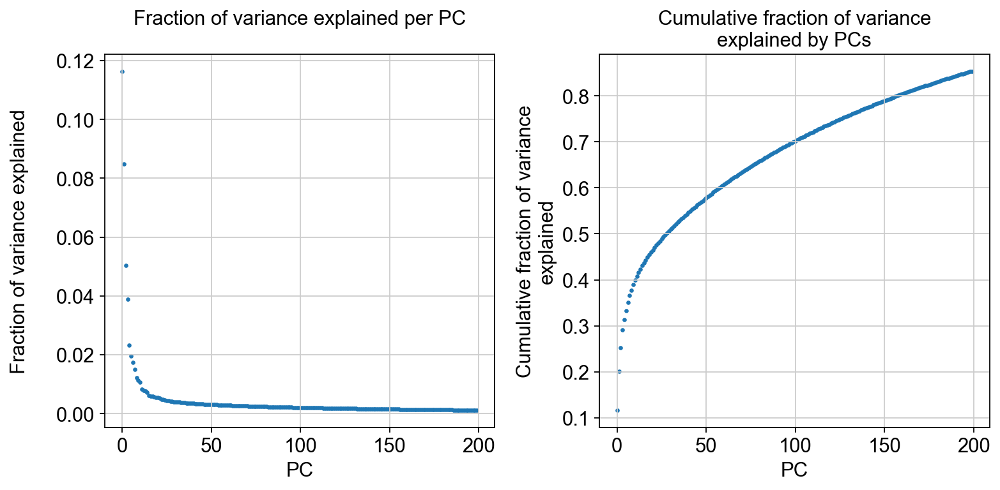

In [81]:
observe_variance(CD45_2_T_cells)

In [82]:
rng = np.random.RandomState(42) # use seed
sc.tl.pca(CD45_2_T_cells, n_comps=50, svd_solver='arpack', random_state=rng, use_highly_variable=True)
sc.pp.neighbors(CD45_2_T_cells, n_neighbors=15)
sc.tl.umap(CD45_2_T_cells)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:15)


In [83]:
for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    sc.tl.leiden(CD45_2_T_cells, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

running Leiden clustering
    finished: found 5 clusters and added
    'leiden_0.1', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 7 clusters and added
    'leiden_0.2', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 8 clusters and added
    'leiden_0.3', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 9 clusters and added
    'leiden_0.4', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 10 clusters and added
    'leiden_0.5', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 11 clusters and added
    'leiden_0.6', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 14 clusters and added
    'leiden_0.7', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clusterin

/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8

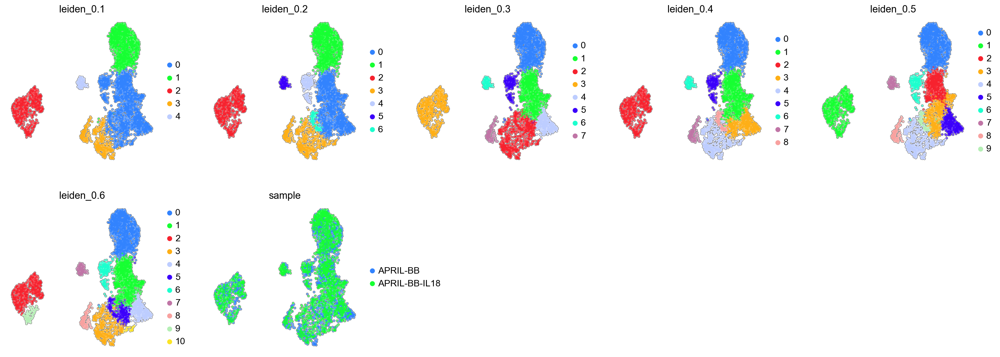

In [85]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)
sc.pl.umap(
    CD45_2_T_cells, 
    color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 'leiden_0.6', 'sample'], 
    palette=user_defined_palette,  
    color_map='Spectral_r',
    use_raw=False,
    ncols=5,
    wspace = 0.2,
    outline_width=[0.1, 0.05],
    size=30,
    frameon=False,
    add_outline=True,
    sort_order = False,
#     save="_T_cells_leiden0_6.pdf"
)

In [89]:
CD45_2_T_cells_to_h5ad = '/Users/brandonng/Google Drive/Weill Cornell/LAB/folder containing all data from Mac pro/experiments and data/single cell/2022-12-21 APRIL BB IL-18 single cell experiment/CD45_2_T_cells.h5ad'


In [90]:
# CD45_2_T_cells.write(CD45_2_T_cells_to_h5ad)

In [91]:
# code to read back your saved h5ad object
CD45_2_T_cells = sc.read_h5ad(CD45_2_T_cells_to_h5ad)
CD45_2_T_cells.uns['log1p']["base"] = None

In [93]:
CD45_2_T_cells

AnnData object with n_obs × n_vars = 4992 × 22956
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'original_total_counts', 'log10_original_total_counts', 'mito_frac', 'ribo_frac', 'hb_frac', 'hash_id', 'doublet_score', 'predicted_doublet', 'n_counts', 'leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0', 'keep_cell', 'distinct', 'cell_type'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mt', 'ribo', 'hb', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cell_type_colors', 'hash_id_colors', 'hvg', 'leiden', 'leiden_0.1_colors', 'leiden_0.2_colors', 'leiden_0.3_colors', 'leiden_0.4_colors', 'leiden_0.5_colors', 

In [ ]:
#ranking genes and GSEApy

In [98]:
writer = pd.ExcelWriter('../2022-12-21 APRIL BB IL-18 single cell experiment/wilcox_distinct/CD45_2_T_cells_wilcox.xlsx', engine='xlsxwriter')

sc.tl.rank_genes_groups(CD45_2_T_cells, 'sample', method='wilcoxon', use_raw=False)
result = CD45_2_T_cells.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'scores', 'logfoldchanges', 'pvals_adj']}).to_excel(writer, sheet_name='CD45_2_T_cells')
        
writer.close()

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:09)
